In [1]:
%load_ext notellm_magic



  Claude can execute shell commands, read/write/edit files, and access the web.
  Only use in trusted environments.

  Consider removing .claude/settings.local.json when done.


🚀 Claude Code Magic loaded!
Features:
  • Full agentic Claude Code execution
  • Cell-based code approval workflow
  • Real-time message streaming
  • Session state preservation
  • Conversation continuity across cells

Usage:
  %cc <instructions>       # Continue with additional instructions (one-line)
  %%cc <instructions>      # Continue with additional instructions (multi-line)
  %cc_new (or %ccn)        # Start fresh conversation
  %cc --help               # Show available options and usage information

Context management:
  %cc --import <file>       # Add a file to be included in initial conversation messages
  %cc --add-dir <dir>       # Add a directory to Claude's accessible directories
  %cc --mcp-config <file>   # Set path to a .mcp.json file containing MCP server configurations
  %cc --cells-to-loa

In [2]:
%cc hello world

🧠 Claude model: claude-sonnet-4-6
💭 Claude: Hello! How can I help you today?
📍 Claude Code Session ID: 7ec00a30-7aa0-4d21-820d-ee535a0d302d


In [3]:
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.parameter import Parameter
import matplotlib.pyplot as plt

import operator
from functools import reduce
from functools import partial
from timeit import default_timer

import sys, os
sys.path.append(os.path.abspath(".."))  # or the project root path
from HJR_FNO.neural_utils import *

torch.manual_seed(0)
np.random.seed(0)

#### import functions from OptimizedDP

In [4]:
import imp
import numpy as np

# Utility functions to initialize the problem
from HJR_FNO.HJR_FNO import Grid

# Specify the  file that includes dynamic systems
# from odp.dynamics import DubinsCapture, Plane2D, Plane1D, DubinsCar4D
# Plot options
# from odp.Plots import PlotOptions
# from odp.Plots import visualize_plots, plot_isosurface, plot_valuefunction
# # Solver core
# from odp.solver import HJSolver, computeSpatDerivArray

import math
import os

/tmp/ipykernel_21201/2926833911.py:1: DeprecationWarning: the imp module is deprecated in favour of importlib and slated for removal in Python 3.12; see the module's documentation for alternative uses
  import imp


In [5]:
################################################################
#  2D Fourier layer
################################################################
class SpectralConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, modes1, modes2):
        super(SpectralConv2d, self).__init__()
        """
        2D Fourier layer. It does FFT, linear transform, and Inverse FFT.

        modes1: number of Fourier modes to keep along x-dimension
        modes2: number of Fourier modes to keep along y-dimension
                (at most floor(N/2) + 1 for each spatial dim)
        """
        self.in_channels  = in_channels
        self.out_channels = out_channels
        self.modes1 = modes1
        self.modes2 = modes2

        self.scale = 1 / (in_channels * out_channels)

        # Two weight tensors to cover both frequency corners in 2D.
        # Shape: (in_ch, out_ch, modes1, modes2) — complex valued.
        #   weights1 → top-left  corner: (+kx, +ky)
        #   weights2 → bottom-left corner: (-kx, +ky)
        self.weights1 = nn.Parameter(
            self.scale * torch.rand(in_channels, out_channels, modes1, modes2,
                                    dtype=torch.cfloat))
        self.weights2 = nn.Parameter(
            self.scale * torch.rand(in_channels, out_channels, modes1, modes2,
                                    dtype=torch.cfloat))

    def compl_mul2d(self, input, weights):
        # (batch, in_ch, x, y), (in_ch, out_ch, x, y) -> (batch, out_ch, x, y)
        # Contracts over in_ch ('i'), keeps both spatial freq axes ('x','y')
        return torch.einsum("bixy,ioxy->boxy", input, weights)

    def forward(self, x):
        batchsize = x.shape[0]
        # x shape: (batch, in_ch, X, Y)

        # 1. 2D real FFT → (batch, in_ch, X, Y//2+1)
        #    rfft2 halves only the LAST axis (y), giving the non-redundant
        #    half of the conjugate-symmetric 2D spectrum.
        x_ft = torch.fft.rfft2(x)

        # 2. Allocate output frequency tensor (same half-spectrum shape)
        out_ft = torch.zeros(batchsize, self.out_channels,
                             x.size(-2), x.size(-1) // 2 + 1,
                             device=x.device, dtype=torch.cfloat)

        # 3. Multiply the two low-frequency corners by learned weights.
        #
        #    Top-left    [:, :, :modes1,  :modes2] — low +kx, low +ky
        out_ft[:, :, :self.modes1, :self.modes2] = \
            self.compl_mul2d(x_ft[:, :, :self.modes1, :self.modes2],
                             self.weights1)

        #    Bottom-left [:, :, -modes1:, :modes2] — low -kx, low +ky
        #    This captures the low-|kx| negative-frequency content that
        #    rfft2 retains in the upper rows of the x-axis spectrum.
        out_ft[:, :, -self.modes1:, :self.modes2] = \
            self.compl_mul2d(x_ft[:, :, -self.modes1:, :self.modes2],
                             self.weights2)

        # 4. Inverse 2D real FFT back to physical space.
        #    s=(x.size(-2), x.size(-1)) ensures the output spatial size
        #    matches the input exactly, compensating for the halved y-axis.
        x = torch.fft.irfft2(out_ft, s=(x.size(-2), x.size(-1)))
        return x


################################################################
#  FNO2d — 4-layer Fourier Neural Operator for 2D problems
################################################################
class FNO2d(nn.Module):
    def __init__(self, modes1, modes2, width):
        super(FNO2d, self).__init__()
        """
        The overall network. It contains 4 layers of the Fourier layer.
        1. Lift the input to the desired channel dimension by self.lifting.
        2. 4 layers of the integral operators u' = (W + K)(u).
               W defined by self.w*  (pointwise Conv2d, kernel=1)
               K defined by self.conv*  (SpectralConv2d)
        3. Project from channel space to output space by self.projection.

        input:  solution + coordinates (a(x,y), x, y)  — arbitrary c_in channels
        input shape:  (batch, X, Y, c_in)
        output: solution at a later time / quantity of interest
        output shape: (batch, X, Y, 1)
        """
        self.modes1 = modes1
        self.modes2 = modes2
        self.width  = width

        # ------- Lifting -------
        # Maps c_in channels → width.  Conv2d(kernel=1) = pointwise operation,
        # identical in role to the 1D version but now over a 2D spatial grid.
        # Adjust in_channels (here 3: a(x,y), x, y) to match your actual input.
        self.lifting    = nn.Conv2d(4, self.width, 1)

        # ------- Fourier blocks -------
        # Spectral (K) paths
        self.conv0 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv1 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv2 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv3 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)

        # Bypass (W) paths — pointwise Conv2d instead of Conv1d
        self.w0 = nn.Conv2d(self.width, self.width, 1)
        self.w1 = nn.Conv2d(self.width, self.width, 1)
        self.w2 = nn.Conv2d(self.width, self.width, 1)
        self.w3 = nn.Conv2d(self.width, self.width, 1)

        # ------- Projection -------
        self.projection = nn.Conv2d(self.width, 1, 1)

    def forward(self, x):
        # x: (batch, X, Y, c_in)

        # --- Lifting ---
        # Permute to channel-first for Conv2d: (batch, c_in, X, Y)
        x = x.permute(0, 3, 1, 2)
        x = self.lifting(x)                          # → (batch, width, X, Y)

        # --- Fourier Block 0 ---
        x1 = self.conv0(x)                           # spectral path  K(u)
        x2 = self.w0(x)                              # bypass path    W(u)
        x  = x1 + x2
        x  = F.relu(x)

        # --- Fourier Block 1 ---
        x1 = self.conv1(x)
        x2 = self.w1(x)
        x  = x1 + x2
        x  = F.relu(x)

        # --- Fourier Block 2 ---
        x1 = self.conv2(x)
        x2 = self.w2(x)
        x  = x1 + x2
        x  = F.relu(x)

        # --- Fourier Block 3 ---
        x1 = self.conv3(x)
        x2 = self.w3(x)
        x  = x1 + x2
        x  = F.relu(x)

        # --- Projection ---
        x = self.projection(x)                       # → (batch, 1, X, Y)
        x = x.permute(0, 2, 3, 1)                   # → (batch, X, Y, 1)
        return x

In [6]:
import numpy as np
import scipy.io as sio

################################################################
# Load .mat file(s)
################################################################
def load_mat(path: str) -> dict:
    """
    Load a .mat file saved by our data generation script.
    Returns a plain dict with numpy arrays:
      constraints : (M, nx, ny)       — constraint set SDF per sample
      results     : (M, nx, ny, T)    — BRS time history per sample
      target_set  : (nx, ny)          — fixed target SDF
      tau         : (T,)              — time vector
      x_axis      : (nx,)
      y_axis      : (ny,)
    """
    raw = sio.loadmat(path, squeeze_me=True)
    return {
        "constraints": raw["constraints"].astype(np.float32),  # (M, nx, ny)
        "results":     raw["results"].astype(np.float32),      # (M, nx, ny, T)
        "target_set":  raw["target_set"].astype(np.float32),   # (nx, ny)
        "tau":         raw["tau"].astype(np.float32),          # (T,)
        "x_axis":      raw["x_axis"].astype(np.float32),       # (nx,)
        "y_axis":      raw["y_axis"].astype(np.float32),       # (ny,)
    }


def extract_input(data: dict) -> np.ndarray:
    """
    Input to the network: constraint set SDF, shape (M, nx, ny).

    Following the convention in the original code:
      Inside safe region  : l(x) <= 0
      Outside obstacle    : g(x) >= 0  <==>  -constraint_set
    We negate so that the 'safe interior' is the negative region,
    matching the original obs_all convention.
    """
    return -data["constraints"]   # (M, nx, ny)


def extract_output(data: dict, t_idx: int = -1) -> np.ndarray:
    """
    Output of the network: BRS value function at a given time index.
      t_idx = -1  -> final time step (default, fully grown BRS)
      t_idx =  k  -> slice at tau[k]

    Returns shape (M, nx, ny).
    """
    return data["results"][:, :, :, t_idx]   # (M, nx, ny)


################################################################
# Read data
################################################################
data1 = load_mat("/home/kmuenpra/git/tTLT/training_HJFNO/HJB_training_mat/Plane2D_50x50_100pts_u[neg1_1]_d[neg01_01].mat")
# data2 = load_mat("brs_dataset_2.mat")   # uncomment to add more files

x_data = np.concatenate([
    extract_input(data1),
    # extract_input(data2),
], axis=0)   # (M_total, nx, ny)

y_data = np.concatenate([
    data1["results"],   # (M, nx, ny, T)
], axis=0)

print("input  shape:", x_data.shape)   # (M, 50, 50)
print("output shape:", y_data.shape)   # (M, 50, 50)

print("========================")
print("x-axis", data1["x_axis"])
print("y-axis", data1["y_axis"])
print("time array", data1["tau"])


input  shape: (100, 50, 50)
output shape: (100, 50, 50, 41)
x-axis [-10.          -9.591837    -9.183674    -8.77551     -8.367347
  -7.9591837   -7.5510206   -7.142857    -6.734694    -6.3265305
  -5.9183674   -5.5102043   -5.102041    -4.6938777   -4.285714
  -3.877551    -3.4693878   -3.0612245   -2.6530612   -2.2448978
  -1.8367347   -1.4285715   -1.0204082   -0.6122449   -0.20408164
   0.20408164   0.6122449    1.0204082    1.4285715    1.8367347
   2.2448978    2.6530612    3.0612245    3.4693878    3.877551
   4.285714     4.6938777    5.102041     5.5102043    5.9183674
   6.3265305    6.734694     7.142857     7.5510206    7.9591837
   8.367347     8.77551      9.183674     9.591837    10.        ]
y-axis [-10.          -9.591837    -9.183674    -8.77551     -8.367347
  -7.9591837   -7.5510206   -7.142857    -6.734694    -6.3265305
  -5.9183674   -5.5102043   -5.102041    -4.6938777   -4.285714
  -3.877551    -3.4693878   -3.0612245   -2.6530612   -2.2448978
  -1.8367347   -1.

### Define grid object

In [7]:
import sys
import os

sys.path.insert(0, '/home/kmuenpra/git/tTLT/optimized_dp')

import numpy as np
from odp.Grid import Grid
from odp.Shapes   import CylinderShape, ShapeRectangle, ShapeEllipsoid


g = Grid(
    minBounds    = np.array([-10.0, -10.0]),
    maxBounds    = np.array([ 10.0,  10.0]),
    dims         = 2,
    pts_each_dim = np.array([50, 50]),
    periodicDims = [],
)

print(f"x: [{g.grid_points[0][0]:.2f}, {g.grid_points[0][-1]:.2f}]")
print(f"y: [{g.grid_points[1][0]:.2f}, {g.grid_points[1][-1]:.2f}]")

x: [-10.00, 10.00]
y: [-10.00, 10.00]


### Visualize dataset

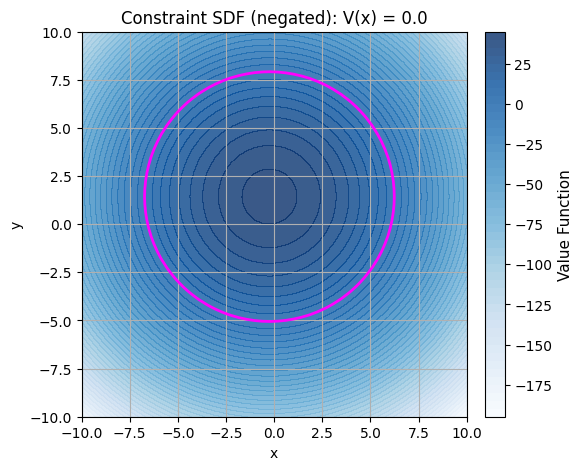

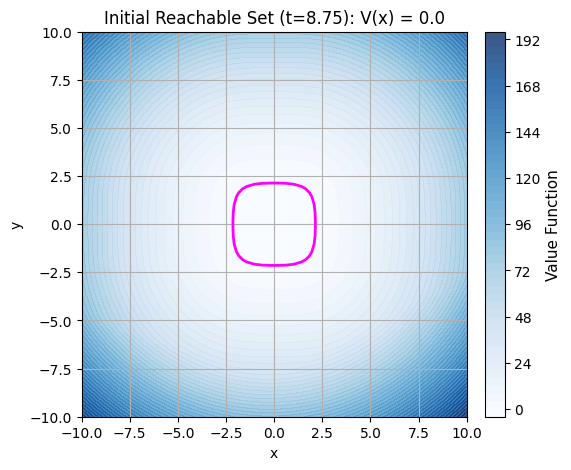

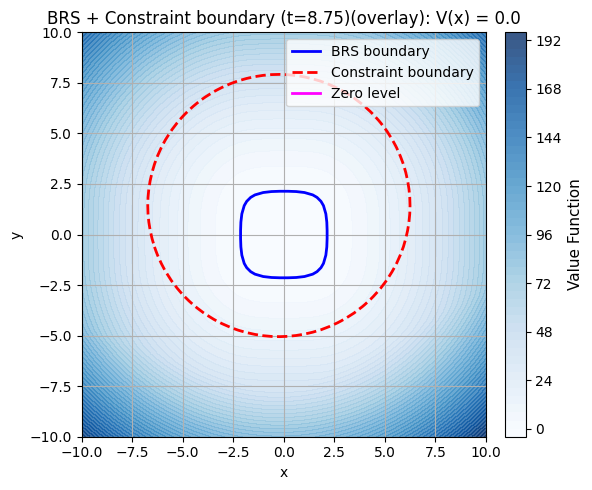

In [9]:
import numpy as np
import matplotlib.pyplot as plt

def plot_levelset_2d(
    x_axis: np.ndarray,
    y_axis: np.ndarray,
    reachable_set: np.ndarray,
    title_txt: str = "Level-set Boundary",
    fig: plt.Figure = None,
    level_value: float = 0.0,
    line_color: str = "magenta",
    show_color_bar: bool = False,
):
    """
    Plot a level set boundary V(x) = level_value of a 2D reachable set.

    Parameters
    ----------
    x_axis       : (nx,)    grid points along x
    y_axis       : (ny,)    grid points along y
    reachable_set: (nx, ny) value function slice
    title_txt    : plot title
    fig          : existing figure to draw on (hold-on mode), or None
    level_value  : level to contour (default 0)
    line_color   : contour line color
    show_color_bar: whether to add a colorbar
    """
    assert reachable_set.ndim == 2, \
        f"reachable_set must be 2D, got shape {reachable_set.shape}"
    assert reachable_set.shape == (len(x_axis), len(y_axis)), \
        f"Shape mismatch: reachable_set {reachable_set.shape} vs grid ({len(x_axis)}, {len(y_axis)})"

    if fig is not None:
        ax = fig.gca()
    else:
        fig, ax = plt.subplots(figsize=(6, 5))

    X, Y = np.meshgrid(x_axis, y_axis, indexing="ij")

    # Filled contour (value function background)
    contourf = ax.contourf(
        X, Y, reachable_set,
        levels=50, cmap="Blues",
        vmin=np.min(reachable_set), vmax=np.max(reachable_set),
        alpha=0.8,
    )

    # Zero-level boundary
    ax.contour(
        X, Y, reachable_set,
        levels=[level_value],
        colors=line_color,
        linewidths=2,
    )

    if show_color_bar:
        cbar = plt.colorbar(contourf, ax=ax, fraction=0.046, pad=0.04)
        cbar.set_label("Value Function", fontsize=11)

    ax.set_title(f"{title_txt}: V(x) = {level_value}")
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_xlim(x_axis[0], x_axis[-1])
    ax.set_ylim(y_axis[0], y_axis[-1])
    ax.set_aspect("equal")
    ax.grid(True)

    return fig, ax


################################################################
# Load data (assumed already loaded via load_mat / extract_*)
################################################################
# x_data : (M, nx, ny)       — negated constraint SDFs
# y_data : (M, nx, ny, T)    — full BRS time history
# data1  : dict from load_mat(), contains x_axis and y_axis

x_axis = data1["x_axis"]   # (50,)
y_axis = data1["y_axis"]   # (50,)

################################################################
# Visualise
################################################################
sample_idx = 0   # change to any index in [0, M)
time_idx = 35

# ── Constraint SDF ────────────────────────────────────────────
fig1, ax1 = plot_levelset_2d(
    x_axis, y_axis,
    x_data[sample_idx],           # (nx, ny)  negated constraint SDF
    title_txt="Constraint SDF (negated)",
    show_color_bar=True,
)

# ── Final BRS (last time step) ────────────────────────────────
fig2, ax2 = plot_levelset_2d(
    x_axis, y_axis,
    y_data[sample_idx, :, :, time_idx],  # (nx, ny)  BRS at t=tau[time_idx]
    title_txt=f"Initial Reachable Set (t={data1['tau'][time_idx]})",
    show_color_bar=True,
)

# ── Overlay: constraint + BRS on the same axes ────────────────
fig3, ax3 = plot_levelset_2d(
    x_axis, y_axis,
    y_data[sample_idx, :, :, time_idx],
    title_txt=f"BRS + Constraint boundary (t={data1['tau'][time_idx]})(overlay)",
    line_color="blue",
    show_color_bar=True,
)
# add constraint boundary in red on top
ax3.contour(
    *np.meshgrid(x_axis, y_axis, indexing="ij"),
    -x_data[sample_idx],          # original (un-negated) constraint SDF
    levels=[0], colors="red", linewidths=2, linestyles="--",
)
ax3.legend(
    handles=[
        plt.Line2D([0], [0], color="blue",    lw=2, label="BRS boundary"),
        plt.Line2D([0], [0], color="red",     lw=2, linestyle="--", label="Constraint boundary"),
        plt.Line2D([0], [0], color="magenta", lw=2, label="Zero level"),
    ],
    loc="upper right",
)

plt.tight_layout()
plt.show()

In [10]:
################################################################
#  Split Train and Test data
################################################################

N = x_data.shape[0] 
perm = np.random.permutation(N)

train_ratio = 0.90   # 95% train
N_train = int(train_ratio * N)

train_idx = perm[:N_train]
test_idx  = perm[N_train:]

x_train = x_data[train_idx,...]
y_train = y_data[train_idx,...]

x_test  = x_data[test_idx,...]
y_test  = y_data[test_idx,...]

print("data input", x_train.shape)
print("data output", y_train.shape)


data input (90, 50, 50)
data output (90, 50, 50, 41)


In [11]:
################################################################
#  Append Training & Testing data with 4 Spatial Channels
#  Channels: (SDF, x, y, t)
#
#  x_data shape: (N, 50, 50)        — SDF defined on 2D grid
#  y_data shape: (N, 50, 50, 41)    — value function over 41 time slices
#
#  Strategy: loop over (samples, time_slices) to expand batch dimension.
#  Each entry is one (SDF, t) -> V(x,y,t) query.
#  No flattening or downsampling — FNO2d preserves the full 2D grid.
################################################################

import torch
import numpy as np

# ---- Hyperparameters --------------------------------------------------------
# Time axis: 41 slices, adjust bounds to match your reachable set
time_hyparam = data1["tau"]   # shape (41,)
stride       = 1                        # set >1 to subsample time if needed
time_i       = range(len(time_hyparam))[::stride]

# Spatial grid — must match g.grid_points[0], g.vs[1] from your grid object
Nx, Ny = 50, 50
# Replace these linspaces with g.vs[0], g.vs[1] if available
xs = data1["x_axis"]
ys = data1["y_axis"]

# Build 2D meshgrid — shape (Nx, Ny) each
# indexing='ij' so axis 0 = x, axis 1 = y  (consistent with grid convention)
X_grid, Y_grid = np.meshgrid(xs, ys, indexing='ij')

# Convert to torch for easy broadcasting later — shape (1, Nx, Ny, 1)
X_torch = torch.tensor(X_grid, dtype=torch.float32).unsqueeze(0).unsqueeze(-1)
Y_torch = torch.tensor(Y_grid, dtype=torch.float32).unsqueeze(0).unsqueeze(-1)

# ---- Helper -----------------------------------------------------------------
def build_dataset(sdf_data, reach_data, indices, time_indices, X_torch, Y_torch):
    """
    Args:
        sdf_data   : numpy (N, Nx, Ny)        — SDF for each sample
        reach_data : numpy (N, Nx, Ny, T)     — reachable set for each sample/time
        indices    : array of sample indices to use
        time_indices: iterable of time indices to loop over

    Returns:
        xx : torch.Tensor (M, Nx, Ny, 4)   — input  [SDF, x, y, t]
        yy : torch.Tensor (M, Nx, Ny, 1)   — output [V(x,y,t)]

        where M = len(indices) * len(time_indices)
    """
    Nx, Ny = sdf_data.shape[1], sdf_data.shape[2]
    M      = len(indices) * len(list(time_indices))
    xx     = torch.empty(M, Nx, Ny, 4, dtype=torch.float32)
    yy     = torch.empty(M, Nx, Ny, 1, dtype=torch.float32)

    j = 0
    for sample_i in range(len(indices)):
        # SDF for this sample — shape (Nx, Ny)
        sdf_slice = torch.tensor(sdf_data[sample_i], dtype=torch.float32)

        for t_i in time_indices:
            t_val = float(time_hyparam[t_i])

            # --- Channel 0: SDF(x, y) — shape (Nx, Ny) ---
            xx[j, :, :, 0] = sdf_slice

            # --- Channel 1: x coordinate — shape (Nx, Ny) ---
            xx[j, :, :, 1] = X_torch[0, :, :, 0]

            # --- Channel 2: y coordinate — shape (Nx, Ny) ---
            xx[j, :, :, 2] = Y_torch[0, :, :, 0]

            # --- Channel 3: time t — scalar broadcast to (Nx, Ny) ---
            xx[j, :, :, 3] = t_val * torch.ones(Nx, Ny)

            # --- Output: V(x, y) at time t_i — shape (Nx, Ny, 1) ---
            reach_slice = torch.tensor(
                reach_data[sample_i, :, :, t_i], dtype=torch.float32)
            yy[j, :, :, 0] = reach_slice

            j += 1

    return xx, yy


# ---- Build train set --------------------------------------------------------
xx_train, yy_train = build_dataset(
    x_train, y_train, train_idx, time_i, X_torch, Y_torch)

# ---- Build test set ---------------------------------------------------------
xx_test, yy_test = build_dataset(
    x_test, y_test, test_idx, time_i, X_torch, Y_torch)

print("Train input  shape:", xx_train.shape)   # (N_train * T, 50, 50, 4)
print("Train output shape:", yy_train.shape)   # (N_train * T, 50, 50, 1)
print("Test  input  shape:", xx_test.shape)    # (N_test  * T, 50, 50, 4)
print("Test  output shape:", yy_test.shape)    # (N_test  * T, 50, 50, 1)

Train input  shape: torch.Size([3690, 50, 50, 4])
Train output shape: torch.Size([3690, 50, 50, 1])
Test  input  shape: torch.Size([410, 50, 50, 4])
Test  output shape: torch.Size([410, 50, 50, 1])


In [12]:
# What coordinate range did your training data actually use?
print("Training x range:", xx_train[0, :, :, 1].min().item(), 
                           xx_train[0, :, :, 1].max().item())
print("Training y range:", xx_train[0, :, :, 2].min().item(), 
                           xx_train[0, :, :, 2].max().item())
print("Grid x range:    ", g.grid_points[0][0], g.grid_points[0][-1])

Training x range: -10.0 10.0
Training y range: -10.0 10.0
Grid x range:     -10.0 10.0


In [13]:
################################################################
#  Configurations
################################################################
ntrain = xx_train.shape[0]
ntest  = xx_test.shape[0]

batch_size    = 32
learning_rate = 1e-3
epochs        = 300
step_size     = 100
gamma         = 0.5
modes         = 16   # applied to both x and y axes (≤ 25 for a 50-pt grid)
width         = 64

train_loader = torch.utils.data.DataLoader(
    torch.utils.data.TensorDataset(xx_train, yy_train),
    batch_size=batch_size,
    shuffle=True,
    pin_memory=True,
    num_workers=4,
    persistent_workers=True
)
test_loader = torch.utils.data.DataLoader(
    torch.utils.data.TensorDataset(xx_test, yy_test),
    batch_size=batch_size,
    shuffle=False
)

# modes ≤ floor(50/2) + 1 = 26, so 16 is safely within budget
model = FNO2d(modes, modes, width).cuda()

In [14]:
len(train_loader)

116

### Benchmark for training time

In [12]:
import torch
import time
print(torch.__version__)                        # 2.5.1+cu121
print(torch.cuda.is_available())                # True
print(torch.cuda.get_device_name(0))            # NVIDIA GeForce RTX 4050 Laptop GPU
print(torch.cuda.get_device_capability(0))      # (8, 9)


def smooth_linf_loss(out, y, alpha):
    """
    Smooth approximation of L∞ loss via log-sum-exp.
    out, y: (B, N) — flattened spatial dims
    """
    err = torch.abs(out - y)
    m   = err.max(dim=1, keepdim=True)[0]          # stabilize logsumexp
    return (m + torch.log(
        torch.mean(torch.exp(alpha * (err - m)), dim=1, keepdim=True)
    ) / alpha).mean()

#Optimizer
optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=learning_rate,
        weight_decay=1e-4
    )

myloss = LpLoss(size_average=False)
model.train()
x, y = next(iter(train_loader))
x, y = x.cuda(), y.cuda()
out_f = lambda out: out.view(out.size(0), -1)
y_f   = y.view(y.size(0), -1)

# ---- Warmup -----------------------------------------------------------------
for _ in range(3):
    out  = model(x)
    loss = myloss(out_f(out), y_f)
    loss.backward()
    optimizer.zero_grad()

# ---- Benchmark L2 step ------------------------------------------------------
torch.cuda.synchronize()
t0 = time.time()
for _ in range(20):
    optimizer.zero_grad()
    out  = model(x)
    loss = myloss(out_f(out), y_f)
    loss.backward()
    optimizer.step()
torch.cuda.synchronize()
t1 = time.time()
step_l2 = (t1 - t0) / 20

# ---- Benchmark L∞ step ------------------------------------------------------
torch.cuda.synchronize()
t0 = time.time()
for _ in range(20):
    optimizer.zero_grad()
    out   = model(x)
    of, yf = out_f(out), y_f
    linf  = smooth_linf_loss(of, yf, alpha=5.0)
    l2    = myloss(of, yf)
    loss  = 0.2 * linf + 0.8 * l2
    loss.backward()
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
    optimizer.step()
torch.cuda.synchronize()
t1 = time.time()
step_linf = (t1 - t0) / 20

# ---- Estimates --------------------------------------------------------------
steps_per_epoch = len(train_loader)                     # ~116
pretrain_epochs = 50
linf_epochs     = 100

time_pretrain = step_l2   * steps_per_epoch * pretrain_epochs
time_linf     = step_linf * steps_per_epoch * linf_epochs
time_total    = time_pretrain + time_linf

print(f"L2  step : {step_l2:.3f}s  |  L∞ step : {step_linf:.3f}s")
print(f"Steps/epoch: {steps_per_epoch}")
print(f"")
print(f"L2  pretrain ({pretrain_epochs} epochs) : {time_pretrain/60:.1f} min")
print(f"L∞  refinement ({linf_epochs} epochs)  : {time_linf/60:.1f} min")
print(f"Total                                  : {time_total/60:.1f} min  (~{time_total/3600:.2f} hrs)")

2.5.1+cu121
True
NVIDIA GeForce RTX 4050 Laptop GPU
(8, 9)
L2  step : 0.055s  |  L∞ step : 0.058s
Steps/epoch: 116

L2  pretrain (50 epochs) : 5.3 min
L∞  refinement (100 epochs)  : 11.2 min
Total                                  : 16.5 min  (~0.28 hrs)


### Load/ Train model

In [15]:
################################################################
#  Training and Evaluation — FNO2d
#  Train input  shape: (3690, 50, 50, 4)
#  Train output shape: (3690, 50, 50, 1)
#  Test  input  shape: ( 410, 50, 50, 4)
#  Test  output shape: ( 410, 50, 50, 1)
################################################################
import os
from tqdm import tqdm
from timeit import default_timer

def smooth_linf_loss(out, y, alpha):
    """
    Smooth approximation of L∞ loss via log-sum-exp.
    out, y: (B, N) — flattened spatial dims
    """
    err = torch.abs(out - y)
    m   = err.max(dim=1, keepdim=True)[0]          # stabilize logsumexp
    return (m + torch.log(
        torch.mean(torch.exp(alpha * (err - m)), dim=1, keepdim=True)
    ) / alpha).mean()


# ---- Paths ------------------------------------------------------------------
save_path       = '/home/kmuenpra/git/tTLT/training_HJFNO/model/02_hjrno_Plane2D_Until_u[neg1_1]_d[neg01_01].pt'
checkpoint_path = '/home/kmuenpra/git/tTLT/training_HJFNO/model/02_linf_checkpoint.pt'

train_with_Linf = True

# ---- Dataset sizes (corrected) ----------------------------------------------
ntrain = xx_train.shape[0]   # 3690
ntest  = xx_test.shape[0]    # 410  ← was incorrectly yy_train.shape[0] before


# =============================================================================
if os.path.exists(save_path):
# =============================================================================

    # ---- Load full model --------------------------------------------------------
    model = torch.load(save_path, weights_only=False, map_location='cuda')
    model.eval()
    print(f"Model loaded from:      {save_path}")
    print(f"Model type: {type(model)}")

    # ---- Load checkpoint --------------------------------------------------------
    checkpoint = torch.load(checkpoint_path, weights_only=False, map_location='cuda')
    print(f"\nCheckpoint loaded from: {checkpoint_path}")
    print(f"  Last epoch   : {checkpoint['epoch']}")
    print(f"  Global step  : {checkpoint['global_step']}")
    print(f"  Alpha        : {checkpoint['alpha']:.4f}")
    print(f"  Lambda L∞    : {checkpoint['lambda_linf']}")
    print(f"  lr_linf      : {checkpoint['lr_linf']}")


# =============================================================================
elif train_with_Linf:
# =============================================================================

    # ---- Hyperparameters ----------------------------------------------------
    pretrain_epochs = 60          # L2 warmup phase
    linf_epochs     = 190 #200         # L∞ refinement phase
    alpha_start     = 2.0
    alpha_end       = 15.0
    lambda_linf     = 0.2         # weight on L∞ term; (1 - lambda_linf) on L2
    lr_pretrain     = 1e-3        # higher LR justified by larger dataset
    lr_linf         = 5e-5        # drop LR for high-curvature L∞ phase

    # ---- Optimizer & scheduler ----------------------------------------------
    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=lr_pretrain,
        weight_decay=1e-4
    )

    # OneCycleLR only during L2 pretraining
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        optimizer,
        max_lr=lr_pretrain,
        steps_per_epoch=len(train_loader),
        epochs=pretrain_epochs,
        div_factor=1e3,
        final_div_factor=1e3
    )

    myloss = LpLoss(size_average=False)

    # ---- Alpha continuation -------------------------------------------------
    total_linf_iterations = linf_epochs * len(train_loader)
    alpha      = alpha_start
    alpha_step = (alpha_end - alpha_start) / total_linf_iterations
    global_step = 0

    # ---- Training loop ------------------------------------------------------
    for epoch in range(pretrain_epochs + linf_epochs):

        model.train()
        train_l2   = 0.0
        train_linf = 0.0
        t1 = default_timer()

        # Switch to lower LR at start of L∞ phase
        if epoch == pretrain_epochs:
            for pg in optimizer.param_groups:
                pg['lr'] = lr_linf

        for x, y in train_loader:
            x = x.cuda()                               # (B, 50, 50, 4)
            y = y.cuda()                               # (B, 50, 50, 1)

            optimizer.zero_grad()
            out = model(x)                             # (B, 50, 50, 1)

            # Flatten spatial dims for loss: (B, 2500)
            out_f = out.view(out.size(0), -1)
            y_f   = y.view(y.size(0),   -1)

            # ------ Phase 1: L2 warmup ------
            if epoch < pretrain_epochs:
                loss = myloss(out_f, y_f)
                train_l2 += loss.item()

            # ------ Phase 2: L∞ refinement ------
            else:
                alpha = min(alpha_end, alpha + alpha_step)

                linf = smooth_linf_loss(out_f, y_f, alpha)
                l2   = myloss(out_f, y_f)
                loss = lambda_linf * linf + (1.0 - lambda_linf) * l2

                train_linf += linf.item()
                train_l2   += l2.item()

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            if epoch < pretrain_epochs:
                scheduler.step()

            global_step += 1

        # ---- Evaluation on test set -----------------------------------------
        model.eval()
        test_l2 = 0.0
        with torch.no_grad():
            for x, y in test_loader:
                x, y = x.cuda(), y.cuda()
                out   = model(x)
                test_l2 += myloss(
                    out.view(out.size(0), -1),
                    y.view(y.size(0),   -1)
                ).item()

        t2 = default_timer()
        train_l2   /= len(train_loader)
        train_linf /= len(train_loader)
        test_l2    /= ntest

        # ---- Logging --------------------------------------------------------
        if epoch < pretrain_epochs:
            print(
                f"[L2]  Epoch {epoch:03d}/{pretrain_epochs} | "
                f"time {t2-t1:.1f}s | "
                f"train L2 = {train_l2:.3e} | "
                f"test L2  = {test_l2:.3e}"
            )
        else:
            linf_ep = epoch - pretrain_epochs
            print(
                f"[L∞]  Epoch {linf_ep:03d}/{linf_epochs} | "
                f"time {t2-t1:.1f}s | "
                f"α = {alpha:.2f} | "
                f"train L∞ = {train_linf:.3e} | "
                f"train L2 = {train_l2:.3e} | "
                f"test  L2 = {test_l2:.3e}"
            )

    torch.save(model, save_path)
    torch.save({
        'model_state_dict':     model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'epoch':                pretrain_epochs + linf_epochs - 1,
        'global_step':          global_step,
        'alpha':                alpha,
        'alpha_step':           alpha_step,
        'pretrain_epochs':      pretrain_epochs,
        'linf_epochs':          linf_epochs,
        'alpha_start':          alpha_start,
        'alpha_end':            alpha_end,
        'lambda_linf':          lambda_linf,
        'lr_pretrain':          lr_pretrain,
        'lr_linf':              lr_linf,
        'scheduler_state_dict': None,
    }, checkpoint_path)
    print(f"Model saved to:      {save_path}")
    print(f"Checkpoint saved to: {checkpoint_path}")


# =============================================================================
else:   # plain L2 training
# =============================================================================

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=learning_rate,
        weight_decay=1e-4
    )

    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        optimizer,
        max_lr=learning_rate,
        div_factor=1e4,
        final_div_factor=1e4,
        steps_per_epoch=len(train_loader),
        epochs=epochs
    )

    myloss = LpLoss(size_average=False)

    for ep in tqdm(range(epochs)):
        model.train()
        t1       = default_timer()
        train_mse = 0.0
        train_l2  = 0.0

        for x, y in train_loader:
            x, y = x.cuda(), y.cuda()                 # (B, 50, 50, 4/1)

            optimizer.zero_grad()
            out = model(x)                             # (B, 50, 50, 1)

            out_f = out.view(out.size(0), -1)
            y_f   = y.view(y.size(0),   -1)

            mse  = F.mse_loss(out_f, y_f, reduction='mean')
            l2   = myloss(out_f, y_f)
            l2.backward()

            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            scheduler.step()

            train_mse += mse.item()
            train_l2  += l2.item()

        model.eval()
        test_l2 = 0.0
        with torch.no_grad():
            for x, y in test_loader:
                x, y = x.cuda(), y.cuda()
                out   = model(x)
                test_l2 += myloss(
                    out.view(out.size(0), -1),
                    y.view(y.size(0),   -1)
                ).item()

        t2 = default_timer()
        train_mse /= len(train_loader)
        train_l2  /= ntrain
        test_l2   /= ntest

        print(
            f"Epoch {ep:03d} | time {t2-t1:.1f}s | "
            f"MSE {train_mse:.3e} | train L2 {train_l2:.3e} | test L2 {test_l2:.3e}"
        )

    torch.save(model, save_path)
    print(f"Model saved to: {save_path}")

Model loaded from:      /home/kmuenpra/git/tTLT/training_HJFNO/model/02_hjrno_Plane2D_Until_u[neg1_1]_d[neg01_01].pt
Model type: <class '__main__.FNO2d'>

Checkpoint loaded from: /home/kmuenpra/git/tTLT/training_HJFNO/model/02_linf_checkpoint.pt
  Last epoch   : 249
  Global step  : 29000
  Alpha        : 15.0000
  Lambda L∞    : 0.2
  lr_linf      : 5e-05


### [Optional] Extra training for pre-trained model using checkpoint

In [25]:
%cc_new my FNO modle doesnt predict well when time parameter is t>8. Is there a way to improve training on my model starting from previous checkpoint files /home/kmuenpra/git/tTLT/training_HJFNO/model/02_linf_checkpoint.pt


🤖 Claude wants to execute code
------------------------------------------------------------
📋 To approve: Run the cell below
➡️ To continue Claude agentically afterward: Run %cc

🧠 Claude model: claude-sonnet-4-6
⏺ Agent
⏺ Bash("find /home/kmuenpra/git/tTLT/training_HJFNO -type f \( -name "*.py" -o -name "*.ipynb" \) | head -20")
⏺ Bash("find /home/kmuenpra/git/tTLT/training_HJFNO -type f \( -name "*.py" -o -name "*.ipynb" \)")
⏺ Bash("ls -la /home/kmuenpra/git/tTLT/training_HJFNO/")
⏺ Read(/home/kmuenpra/git/tTLT/training_HJFNO/finite_time_HJB.py)
⏺ Read(/home/kmuenpra/git/tTLT/training_HJFNO/Plane2D_data_gen.py)
⏺ Read(/home/kmuenpra/git/tTLT/training_HJFNO/HJRNO_training.ipynb)
⏺ Bash("grep -n "time\|checkpoint\|loss\|train\|device\|DataLoader\|model\|state_dict\|save\|load" /home/kmuenpra/git/tTLT/training_HJFNO/HJRNO_training.ipynb | head -100")
⏺ Bash("grep -n "epoch\|loss\|backward\|optimizer\|scheduler\|validation" /home/kmuenpra/git/tTLT/training_HJFNO/HJRNO_training.ipynb | 

💭 Claude: Now I have a clear picture. Your training data has T=41 time steps (0 to 10, step 0.25), but t > 8 corresponds to only the last 8 indices (33-40, ~20% of data). The model is likely under-fitted on those steps because the standard L∞ loss optimizes uniformly across all time steps.

The fix: **fine-tune from checkpoint with a time-weighted loss** that emphasizes t > 8 samples, using a very low learning rate to avoid catastrophic forgetting.

⏺ ToolSearch
⏺ CreateNotebookCell


💭 Claude: Here's what the cell does and why:

**Root cause**: t > 8 is only ~20% of your time steps (indices 33–40). The uniform L∞ loss doesn't emphasize them enough, so the model under-fits that region.

**Fix — `WeightedRandomSampler`**: Oversamples t ≥ 7.0 samples **5× more often** per epoch. This gives the model ~5× as many gradient updates from late-time samples without discarding early-time data (preventing catastrophic forgetting).

**Key choices**:
| Parameter | Value | Reason |
|---|---|---|
| `FINETUNE_LR` | `5e-6` | 100× smaller than original — refine, not re-train |
| `T_FOCUS` | `7.0` | Start boost slightly before t=8 for smoother transition |
| `HIGH_WEIGHT` | `5.0` | ~5× more late-time gradient steps per epoch |
| `ALPHA_FIXED` | `15.0` | Already at max from checkpoint — keep tight L∞ |
| `LAMBDA_LINF` | `0.3` | Slightly more L∞ emphasis than original 0.2 |

After it runs, the best model (by test L∞) is saved to `02_finetune_t8_best.pt`. You can then reload it and re-run `compute_errors` to verify improvement at t > 8.

📍 Claude Code Session ID: c595983f-450e-4321-8089-949a69d89d9b


In [26]:

# ── Fine-tune from checkpoint focusing on t > 8 ──────────────────────────────
# Strategy: WeightedRandomSampler over-samples t >= T_FOCUS samples so the
# L∞ loss "sees" them ~HIGH_WEIGHT× more often per epoch.
# We use a fresh, very small lr so the model improves on late times
# without catastrophically forgetting early times.

from torch.utils.data import WeightedRandomSampler, DataLoader, TensorDataset
from timeit import default_timer
import torch

# ── Config ────────────────────────────────────────────────────────────────────
T_FOCUS        = 7.0    # boost all t >= this (covers the degraded t>8 region)
HIGH_WEIGHT    = 5.0    # over-sample weight for t >= T_FOCUS
FINETUNE_LR    = 5e-6   # small lr: refine without forgetting
FINETUNE_EPOCHS = 80
ALPHA_FIXED    = float(checkpoint['alpha'])   # 15.0 – already at max
LAMBDA_LINF    = 0.3                          # slightly more L∞ than original

# ── 1. Build time-weighted sampler ────────────────────────────────────────────
# xx_train: (ntrain, Nx, Ny, 4)  – channel 3 is the time feature
t_feat = xx_train[:, 0, 0, 3].cpu().numpy()          # (ntrain,)
w = torch.from_numpy(
    __import__('numpy').where(t_feat >= T_FOCUS, HIGH_WEIGHT, 1.0).astype('float64')
)
sampler  = WeightedRandomSampler(w, num_samples=len(w), replacement=True)
ft_loader = DataLoader(TensorDataset(xx_train, yy_train),
                       batch_size=batch_size, sampler=sampler)

n_hi = (t_feat >= T_FOCUS).sum()
print(f"Weighted sampler: {len(t_feat)} total | "
      f"{n_hi} ({100*n_hi/len(t_feat):.1f}%) have t≥{T_FOCUS} → boosted {HIGH_WEIGHT}×")

# ── 2. Fresh optimizer (no scheduler — we want flat low-lr fine-tuning) ───────
ft_opt  = torch.optim.AdamW(model.parameters(), lr=FINETUNE_LR, weight_decay=1e-4)
myloss  = LpLoss(size_average=False)

ft_save_path = checkpoint_path.replace('linf_checkpoint', 'finetune_t8_best')
best_test_linf = float('inf')

print(f"\nFine-tuning  {FINETUNE_EPOCHS} epochs  |  lr={FINETUNE_LR}  |  "
      f"α={ALPHA_FIXED}  |  λ_linf={LAMBDA_LINF}")
print(f"Saving best model → {ft_save_path}\n")

# ── 3. Fine-tuning loop ───────────────────────────────────────────────────────
for epoch in range(FINETUNE_EPOCHS):
    model.train()
    t0 = default_timer()
    tr_l2 = tr_linf = 0.0

    for xb, yb in ft_loader:
        xb, yb = xb.to(device), yb.to(device)
        ft_opt.zero_grad()

        out   = model(xb)                        # (B, Nx, Ny, 1)
        out_f = out.view(out.shape[0], -1)       # (B, Nx*Ny)
        yb_f  = yb.view(yb.shape[0], -1)

        l2   = myloss(out_f, yb_f)
        linf = smooth_linf_loss(out_f, yb_f, ALPHA_FIXED)
        loss = LAMBDA_LINF * linf + (1.0 - LAMBDA_LINF) * l2

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        ft_opt.step()
        tr_l2   += l2.item()
        tr_linf += linf.item()

    # ── Eval on held-out test set ─────────────────────────────────────────────
    model.eval()
    te_l2 = te_linf = 0.0
    with torch.no_grad():
        for xb, yb in test_loader:
            xb, yb = xb.to(device), yb.to(device)
            out_f = model(xb).view(xb.shape[0], -1)
            yb_f  = yb.view(yb.shape[0], -1)
            te_l2   += myloss(out_f, yb_f).item()
            te_linf += smooth_linf_loss(out_f, yb_f, ALPHA_FIXED).item()

    n_tr, n_te = len(ft_loader), len(test_loader)
    if epoch % 10 == 0 or epoch == FINETUNE_EPOCHS - 1:
        print(f"Ep {epoch:03d} | "
              f"Train L2={tr_l2/n_tr:.4f} L∞={tr_linf/n_tr:.4f} | "
              f"Test  L2={te_l2/n_te:.4f} L∞={te_linf/n_te:.4f} | "
              f"{default_timer()-t0:.1f}s")

    avg_te_linf = te_linf / n_te
    if avg_te_linf < best_test_linf:
        best_test_linf = avg_te_linf
        torch.save({'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': ft_opt.state_dict(),
                    'epoch': epoch, 'alpha': ALPHA_FIXED,
                    'lambda_linf': LAMBDA_LINF, 'finetune_lr': FINETUNE_LR,
                    't_focus': T_FOCUS, 'high_weight': HIGH_WEIGHT},
                   ft_save_path)

print(f"\nDone. Best test L∞ = {best_test_linf:.6f}")
print(f"Best model saved → {ft_save_path}")


Weighted sampler: 3690 total | 1170 (31.7%) have t≥7.0 → boosted 5.0×

Fine-tuning  80 epochs  |  lr=5e-06  |  α=15.0  |  λ_linf=0.3
Saving best model → /home/kmuenpra/git/tTLT/training_HJFNO/model/02_finetune_t8_best.pt

Ep 000 | Train L2=0.0733 L∞=0.2298 | Test  L2=0.2399 L∞=0.5309 | 6.7s
Ep 010 | Train L2=0.0723 L∞=0.2190 | Test  L2=0.2395 L∞=0.5245 | 6.7s
Ep 020 | Train L2=0.0725 L∞=0.2082 | Test  L2=0.2388 L∞=0.5120 | 6.7s
Ep 030 | Train L2=0.0711 L∞=0.2030 | Test  L2=0.2389 L∞=0.5151 | 6.7s
Ep 040 | Train L2=0.0694 L∞=0.1908 | Test  L2=0.2383 L∞=0.5151 | 6.7s
Ep 050 | Train L2=0.0719 L∞=0.2090 | Test  L2=0.2383 L∞=0.5165 | 6.7s
Ep 060 | Train L2=0.0712 L∞=0.1986 | Test  L2=0.2387 L∞=0.5248 | 6.7s
Ep 070 | Train L2=0.0680 L∞=0.1748 | Test  L2=0.2384 L∞=0.5203 | 6.7s
Ep 079 | Train L2=0.0683 L∞=0.1817 | Test  L2=0.2374 L∞=0.5058 | 6.7s

Done. Best test L∞ = 0.505073
Best model saved → /home/kmuenpra/git/tTLT/training_HJFNO/model/02_finetune_t8_best.pt


In [27]:
%%cc great! how do i read the file and extract just the model for prediction 
/home/kmuenpra/git/tTLT/training_HJFNO/model/02_finetune_t8_best.pt

✅ Continuing Claude session with execution results...

🤖 Claude wants to execute code
------------------------------------------------------------
📋 To approve: Run the cell below
➡️ To continue Claude agentically afterward: Run %cc

⏺ CreateNotebookCell


💭 Claude: That's all you need. `model` is now ready for inference — `model.load_state_dict(...)` replaces only the weights, leaving the architecture intact.

After running:
- `model.eval()` disables dropout/batchnorm training mode
- Call `model(x)` as usual for predictions — no other changes needed

In [28]:

ft_ckpt = torch.load(ft_save_path, map_location=device, weights_only=False)
model.load_state_dict(ft_ckpt['model_state_dict'])
model.eval()
print(f"Loaded fine-tuned model (epoch {ft_ckpt['epoch']}) from {ft_save_path}")
model


Loaded fine-tuned model (epoch 71) from /home/kmuenpra/git/tTLT/training_HJFNO/model/02_finetune_t8_best.pt


FNO2d(
  (lifting): Conv2d(4, 64, kernel_size=(1, 1), stride=(1, 1))
  (conv0): SpectralConv2d()
  (conv1): SpectralConv2d()
  (conv2): SpectralConv2d()
  (conv3): SpectralConv2d()
  (w0): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
  (w1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
  (w2): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
  (w3): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
  (projection): Conv2d(64, 1, kernel_size=(1, 1), stride=(1, 1))
)

In [ ]:
import torch
from timeit import default_timer

def smooth_linf_loss(out, y, alpha):
    """
    Smooth L∞ loss via log-sum-exp stabilization.
    out, y: (B, N) — flattened spatial dims
    """
    err = torch.abs(out - y)
    m   = err.max(dim=1, keepdim=True)[0]
    return (m + torch.log(
        torch.mean(torch.exp(alpha * (err - m)), dim=1, keepdim=True)
    ) / alpha).mean()


# ==========================================
# Paths
# ==========================================
model_name      = '01_hjrno_Plane2D_Until_u[neg1_1]_d[neg01_01]'
save_dir        = '/home/kmuenpra/git/tTLT/training_HJFNO/model'

run_id = '01'   # prefix shared between model and checkpoint

load_model_path      = os.path.join(save_dir, f'{model_name}.pt')
load_checkpoint_path = os.path.join(save_dir, f'{run_id}_linf_checkpoint.pt')

# New save paths for the continued run
save_model_path      = os.path.join(save_dir, f'{model_name}_continued.pt')
save_checkpoint_path = os.path.join(save_dir, f'{run_id}_linf_checkpoint.pt')  # overwrite same checkpoint

# ==========================================
# Load full model + checkpoint
# ==========================================
model = torch.load(load_model_path, weights_only=False, map_location='cuda')
model.cuda()
print(f"Model loaded from:      {load_model_path}")

checkpoint = torch.load(load_checkpoint_path, weights_only=False, map_location='cuda')
model.load_state_dict(checkpoint['model_state_dict'])  # sync weights with checkpoint
print(f"Checkpoint loaded from: {load_checkpoint_path}")
print(f"  Last epoch   : {checkpoint['epoch']}")
print(f"  Global step  : {checkpoint['global_step']}")
print(f"  Alpha        : {checkpoint['alpha']:.4f}")
print(f"  Lambda L∞    : {checkpoint['lambda_linf']}")
print(f"  lr_linf      : {checkpoint['lr_linf']}")

myloss = LpLoss(size_average=False)

# ==========================================
# Optimizer — restore then optionally override
# ==========================================
optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=1e-4,
    weight_decay=1e-4
)
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

# Override LR and weight decay for the resumed run
new_weight_decay = 0.0
new_lr           = 1e-5
for pg in optimizer.param_groups:
    pg['weight_decay'] = new_weight_decay
    pg['lr']           = new_lr

# ==========================================
# Scheduler — only active during L2 pretrain phase
# ==========================================
scheduler = None
if checkpoint.get('scheduler_state_dict') is not None:
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        optimizer,
        max_lr=checkpoint['lr_pretrain'],
        steps_per_epoch=len(train_loader),
        epochs=checkpoint['pretrain_epochs'],
        div_factor=1e3,
        final_div_factor=1e3
    )
    scheduler.load_state_dict(checkpoint['scheduler_state_dict'])

# ==========================================
# Restore training state
# ==========================================
start_epoch     = checkpoint['epoch'] + 1
global_step     = checkpoint['global_step']
alpha           = checkpoint['alpha']
alpha_step      = checkpoint['alpha_step']

pretrain_epochs = checkpoint['pretrain_epochs']
linf_epochs     = checkpoint['linf_epochs']
alpha_end       = 15.0              # override if desired
lambda_linf     = 0.4               # override if desired
lr_linf         = 2e-5              # override if desired

# ==========================================
# Optionally extend L∞ training
# ==========================================
extra_linf_epochs = 120             # set to 0 to skip extension

if start_epoch >= pretrain_epochs and extra_linf_epochs > 0:
    linf_epochs  += extra_linf_epochs
    print(f"Extending L∞ training by {extra_linf_epochs} epochs")

total_epochs = pretrain_epochs + linf_epochs

# Recompute alpha_step over remaining steps so alpha reaches alpha_end smoothly
if start_epoch >= pretrain_epochs:
    remaining_steps = (total_epochs - start_epoch) * len(train_loader)
    if remaining_steps > 0 and alpha < alpha_end:
        alpha_step = (alpha_end - alpha) / remaining_steps
    else:
        alpha_step = 0.0
    # Ensure LR is in L∞ phase
    for pg in optimizer.param_groups:
        pg['lr'] = lr_linf

print(f"Resuming from epoch {start_epoch} / {total_epochs}")
print(f"Current α = {alpha:.4f} | alpha_step = {alpha_step:.3e}")
print(f"L∞ weight = {lambda_linf} | lr = {lr_linf}")

# ==========================================
# Training loop
# ==========================================
for epoch in range(start_epoch, total_epochs):

    model.train()
    train_l2   = 0.0
    train_linf = 0.0
    t1 = default_timer()

    for x, y in train_loader:
        x = x.cuda()                               # (B, 50, 50, 4)
        y = y.cuda()                               # (B, 50, 50, 1)

        optimizer.zero_grad()
        out = model(x)                             # (B, 50, 50, 1)

        # Flatten for loss: (B, 2500)
        out_f = out.view(out.size(0), -1)
        y_f   = y.view(y.size(0),   -1)

        # --- Phase 1: L2 pretrain ---
        if epoch < pretrain_epochs:
            loss = myloss(out_f, y_f)
            train_l2 += loss.item()

        # --- Phase 2: Smooth L∞ refinement ---
        else:
            alpha = min(alpha_end, alpha + alpha_step)

            linf = smooth_linf_loss(out_f, y_f, alpha)
            l2   = myloss(out_f, y_f)
            loss = lambda_linf * linf + (1.0 - lambda_linf) * l2

            train_linf += linf.item()
            train_l2   += l2.item()

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()

        if epoch < pretrain_epochs and scheduler is not None:
            scheduler.step()

        global_step += 1

    # ---- Test evaluation ----
    model.eval()
    test_l2 = 0.0
    with torch.no_grad():
        for x, y in test_loader:
            x, y = x.cuda(), y.cuda()
            out   = model(x)
            test_l2 += myloss(
                out.view(out.size(0), -1),
                y.view(y.size(0),   -1)
            ).item()
    test_l2 /= ntest

    t2 = default_timer()
    train_l2   /= len(train_loader)
    train_linf /= len(train_loader)

    # ---- Logging ----
    if epoch < pretrain_epochs:
        print(
            f"[Resume L2]  Epoch {epoch:03d}/{total_epochs} | "
            f"time {t2-t1:.1f}s | "
            f"train L2 = {train_l2:.3e} | test L2 = {test_l2:.3e}"
        )
    else:
        linf_ep = epoch - pretrain_epochs
        print(
            f"[Resume L∞]  Epoch {linf_ep:03d}/{linf_epochs} | "
            f"time {t2-t1:.1f}s | "
            f"α = {alpha:.4f} | "
            f"train L∞ = {train_linf:.3e} | "
            f"train L2 = {train_l2:.3e} | "
            f"test  L2 = {test_l2:.3e}"
        )

    # ---- Save checkpoint every epoch ----
    torch.save(model, save_model_path)
    torch.save({
        'model_state_dict':     model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict() if scheduler is not None else None,
        'epoch':                epoch,
        'global_step':          global_step,
        'alpha':                alpha,
        'alpha_step':           alpha_step,
        'pretrain_epochs':      pretrain_epochs,
        'linf_epochs':          linf_epochs,
        'alpha_start':          checkpoint.get('alpha_start', 2.0),
        'alpha_end':            alpha_end,
        'lambda_linf':          lambda_linf,
        'lr_pretrain':          checkpoint.get('lr_pretrain', 1e-3),
        'lr_linf':              lr_linf,
    }, save_checkpoint_path)

print("Retraining complete.")
print(f"Model saved to:      {save_model_path}")
print(f"Checkpoint saved to: {save_checkpoint_path}")

### Predict on the test data

In [29]:
import torch
import numpy as np

def HJR_FNO2d_SuperResQuery(g, sdf_input, time_hyparam, model):
    """
    Query the FNO2d model for a single SDF input across all time slices.
    Output resolution matches sdf_input shape — upsample sdf_input beforehand
    if super-resolution is desired.

    Args:
        g           : grid object with g.min, g.max  (physical domain bounds)
        sdf_input   : np.ndarray (Nx, Ny)  — SDF input, determines output resolution
        time_hyparam: np.ndarray (T,)      — time values to query
        model       : trained FNO2d model

    Returns:
        xx_query      : torch.Tensor (T, Nx, Ny, 4)
        pred_reshaped : torch.Tensor (Nx, Ny, T)
    """
    Nx_out, Ny_out = sdf_input.shape

    T = len(time_hyparam)

    # ---- Coordinate grids ------------------------------------------------
    # Use [-1, 1] to match training normalization.
    # g.min and g.max define the physical domain but coordinates were
    # normalized to [-1, 1] during training — must stay consistent.
    x_out = np.linspace(g.min[0], g.max[0], Nx_out)
    y_out = np.linspace(g.min[1], g.max[1], Ny_out)
    X_out, Y_out = np.meshgrid(x_out, y_out, indexing='ij')   # (Nx_out, Ny_out)

    # SDF shape drives everything — no separate Nx_in/Ny_in needed
    assert sdf_input.ndim == 2, f"sdf_input must be 2D, got shape {sdf_input.shape}"

    sdf_torch = torch.tensor(sdf_input, dtype=torch.float32)   # (Nx_in, Ny_in)
    X_torch   = torch.tensor(X_out,    dtype=torch.float32)    # (Nx_out, Ny_out)
    Y_torch   = torch.tensor(Y_out,    dtype=torch.float32)

    # ---- Build query tensor: (T, Nx_out, Ny_out, 4) ----------------------
    xx_query = torch.empty(T, Nx_out, Ny_out, 4, dtype=torch.float32)
    for t_i in range(T):
        xx_query[t_i, :, :, 0] = sdf_torch                    # SDF(x,y)
        xx_query[t_i, :, :, 1] = X_torch                      # x coord
        xx_query[t_i, :, :, 2] = Y_torch                      # y coord
        xx_query[t_i, :, :, 3] = float(time_hyparam[t_i])     # t broadcast

    # ---- Run inference ---------------------------------------------------
    query_loader = torch.utils.data.DataLoader(
        torch.utils.data.TensorDataset(xx_query),
        batch_size=8,
        shuffle=False
    )

    pred  = torch.zeros(T, Nx_out, Ny_out, dtype=torch.float32)
    index = 0

    model.eval()
    with torch.no_grad():
        for (x,) in query_loader:
            x   = x.cuda()
            out = model(x)                         # (B, Nx_out, Ny_out, 1)
            B   = out.size(0)
            pred[index:index+B] = out.squeeze(-1).cpu()
            index += B

    pred_reshaped = pred.permute(1, 2, 0)          # (Nx_out, Ny_out, T)
    return xx_query, pred_reshaped


=== Test trajectory 0 (original idx=87) ===
  t=0.000 | MSE=7.675e-03 | L∞=4.433e-01


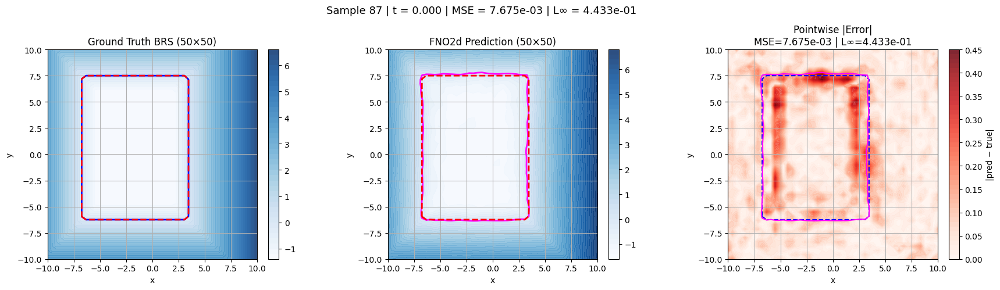

  t=5.000 | MSE=4.912e-03 | L∞=4.297e-01


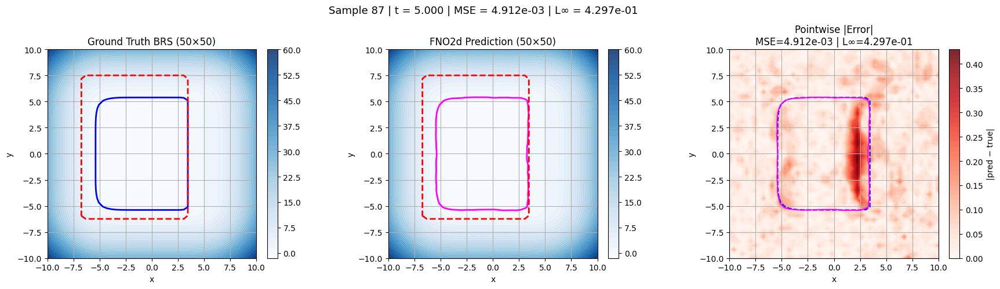

  t=10.000 | MSE=9.335e-03 | L∞=3.274e-01


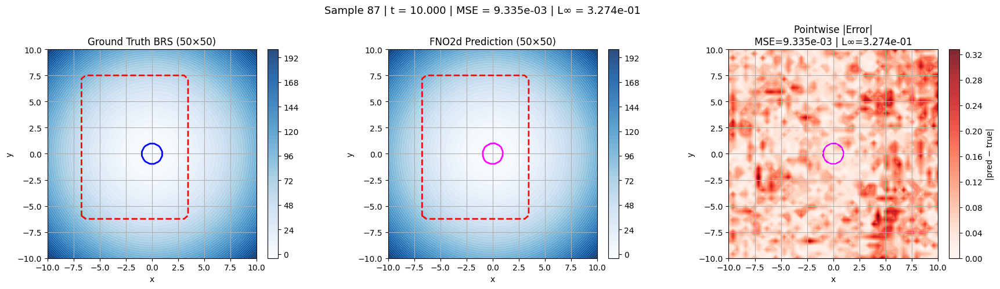


=== Test trajectory 1 (original idx=36) ===
  t=0.000 | MSE=3.914e-02 | L∞=1.226e+00


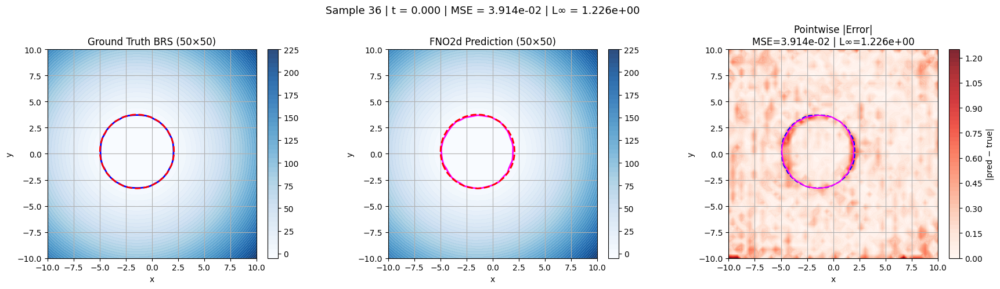

  t=5.000 | MSE=3.712e-02 | L∞=1.077e+00


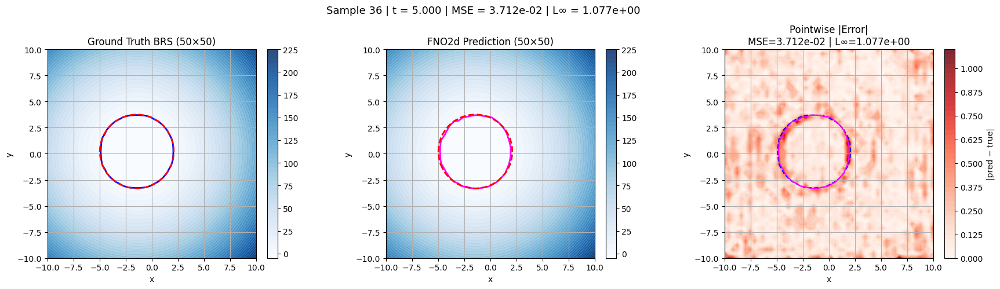

  t=10.000 | MSE=1.447e+00 | L∞=5.826e+00


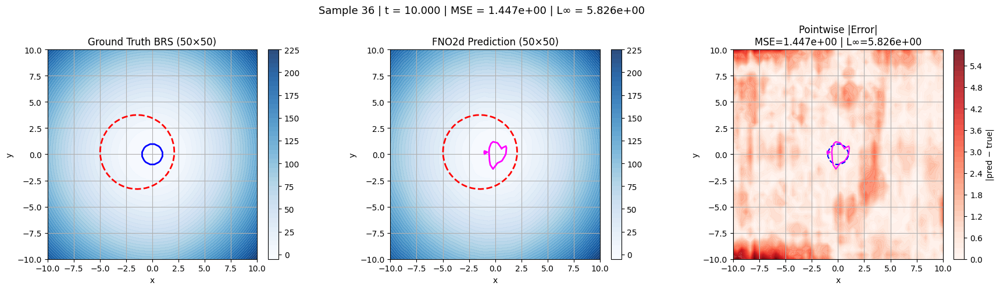


=== Test trajectory 2 (original idx=21) ===
  t=0.000 | MSE=3.443e-04 | L∞=1.121e-01


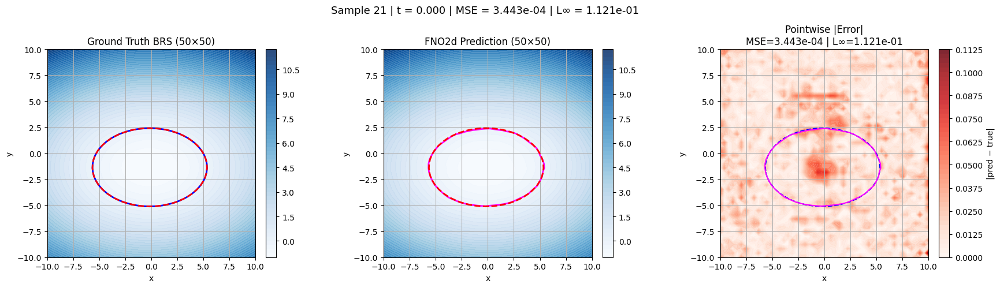

  t=5.000 | MSE=1.202e-03 | L∞=1.181e-01


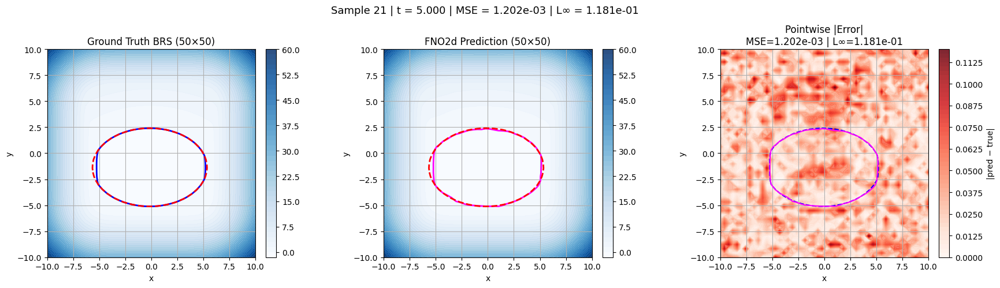

  t=10.000 | MSE=6.464e-03 | L∞=3.127e-01


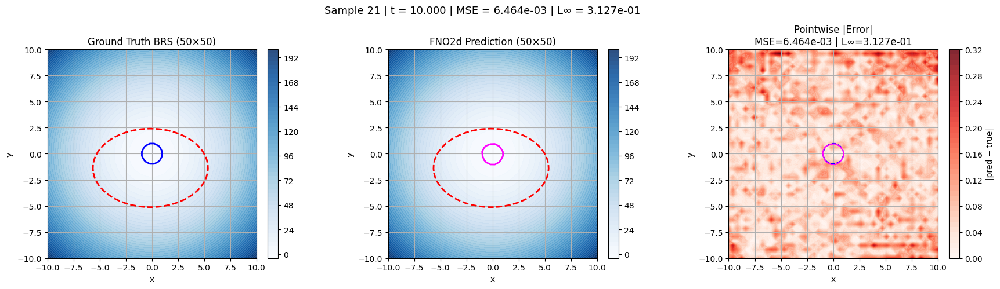


========== Aggregate Test Errors ==========
MSE  — mean: 5.532e-02  |  max: 1.447e+00  |  std: 1.839e-01
L∞   — mean: 7.507e-01 |  max: 5.826e+00 |  std: 9.453e-01


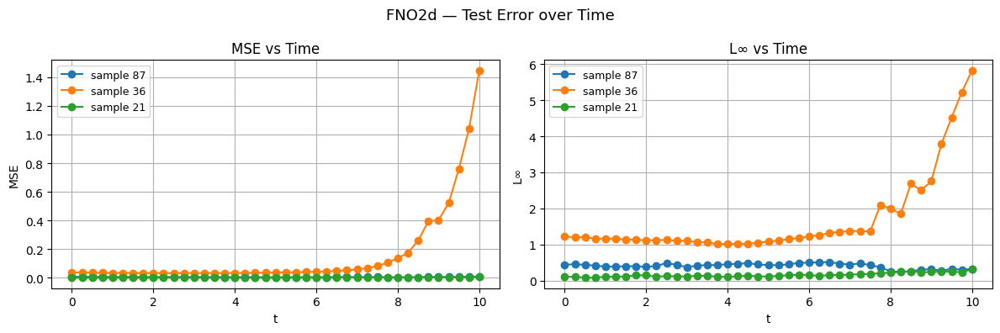

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import torch

################################################################
#  Evaluation helpers
################################################################

def compute_errors(pred, true):
    """
    pred, true: np.ndarray (Nx, Ny) — single 2D slice
    Returns scalar MSE and L∞ error.
    """
    diff = pred - true
    mse  = float(np.mean(diff ** 2))
    linf = float(np.max(np.abs(diff)))
    return mse, linf


def plot_comparison(x_axis_pred, y_axis_pred, pred,
                    x_axis_true, y_axis_true, true,
                    sdf, t_val, sample_idx, mse=None, linf=None):
    """
    Three-panel comparison: True BRS | Predicted BRS | Pointwise Error

    pred and true can be at different resolutions.
    For the error panel, pred is interpolated onto the true (coarse) grid.

    Args:
        x_axis_pred, y_axis_pred : coordinate axes for pred  (Nx_out,) (Ny_out,)
        pred                     : np.ndarray (Nx_out, Ny_out)
        x_axis_true, y_axis_true : coordinate axes for true  (Nx,) (Ny,)
        true                     : np.ndarray (Nx, Ny)
        sdf                      : np.ndarray (Nx, Ny) — at true resolution
    """
    from scipy.interpolate import RegularGridInterpolator

    X_pred, Y_pred = np.meshgrid(x_axis_pred, y_axis_pred, indexing='ij')
    X_true, Y_true = np.meshgrid(x_axis_true, y_axis_true, indexing='ij')

    # Interpolate pred onto the true (coarse) grid for error computation
    interp = RegularGridInterpolator(
        (x_axis_pred, y_axis_pred), pred,
        method='linear', bounds_error=False, fill_value=None
    )
    query_pts      = np.stack([X_true.ravel(), Y_true.ravel()], axis=-1)
    pred_on_true   = interp(query_pts).reshape(true.shape)

    if mse is None or linf is None:
        mse, linf = compute_errors(pred_on_true, true)

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(
        f"Sample {sample_idx} | t = {t_val:.3f} | "
        f"MSE = {mse:.3e} | L∞ = {linf:.3e}",
        fontsize=13
    )

    vmin = min(true.min(), pred.min())
    vmax = max(true.max(), pred.max())

    # ---- Panel 1: Ground truth (coarse) ---------------------------------
    ax = axes[0]
    cf = ax.contourf(X_true, Y_true, true, levels=50, cmap='Blues',
                     vmin=vmin, vmax=vmax, alpha=0.85)
    ax.contour(X_true, Y_true, true, levels=[0], colors='blue',  linewidths=2)
    ax.contour(X_true, Y_true, -sdf, levels=[0], colors='red',   linewidths=2, linestyles='--')
    plt.colorbar(cf, ax=ax, fraction=0.046, pad=0.04)
    ax.set_title(f"Ground Truth BRS ({true.shape[0]}×{true.shape[1]})")
    ax.set_xlabel("x"); ax.set_ylabel("y")
    ax.set_aspect('equal'); ax.grid(True)

    # ---- Panel 2: Prediction (fine) -------------------------------------
    ax = axes[1]
    cf = ax.contourf(X_pred, Y_pred, pred, levels=50, cmap='Blues',
                     vmin=vmin, vmax=vmax, alpha=0.85)
    ax.contour(X_pred, Y_pred, pred, levels=[0], colors='magenta', linewidths=2)
    ax.contour(X_true, Y_true, -sdf, levels=[0], colors='red',     linewidths=2, linestyles='--')
    plt.colorbar(cf, ax=ax, fraction=0.046, pad=0.04)
    ax.set_title(f"FNO2d Prediction ({pred.shape[0]}×{pred.shape[1]})")
    ax.set_xlabel("x"); ax.set_ylabel("y")
    ax.set_aspect('equal'); ax.grid(True)

    # ---- Panel 3: Pointwise error (pred interpolated to true grid) ------
    ax = axes[2]
    err = np.abs(pred_on_true - true)
    cf  = ax.contourf(X_true, Y_true, err, levels=50, cmap='Reds', alpha=0.85)
    ax.contour(X_true, Y_true, true,         levels=[0], colors='blue',    linewidths=1.5, linestyles='--')
    ax.contour(X_true, Y_true, pred_on_true, levels=[0], colors='magenta', linewidths=1.5)
    plt.colorbar(cf, ax=ax, fraction=0.046, pad=0.04, label='|pred − true|')
    ax.set_title(f"Pointwise |Error|\nMSE={mse:.3e} | L∞={linf:.3e}")
    ax.set_xlabel("x"); ax.set_ylabel("y")
    ax.set_aspect('equal'); ax.grid(True)

    plt.tight_layout()
    plt.show()
    return fig


################################################################
#  Evaluation config
################################################################

N_samples      = min(3, len(test_idx))
T              = len(list(time_i))
time_vals      = time_hyparam[list(time_i)]
plot_t_indices = [0, T//2, T-1]

# Coordinate axes matching training normalization [-1, 1]
x_axis = np.linspace(-10.0, 10.0, 50)
y_axis = np.linspace(-10.0, 10.0, 50)

all_mse  = []
all_linf = []

################################################################
#  Main evaluation loop
################################################################

for s in range(N_samples):

    sdf_np  = x_test[s]    # (50, 50)
    true_np = y_test[s]    # (50, 50, T)

    # ---- FNO prediction -------------------------------------------------
    _, pred_reshaped = HJR_FNO2d_SuperResQuery(
        g            = g,
        sdf_input    = sdf_np,
        time_hyparam = time_vals,
        model        = model,
    )
    # pred_reshaped: (Nx, Ny, T) — shape matches sdf_np

    # ---- Pointwise errors over all time slices --------------------------
    for t_i in range(T):
        mse, linf = compute_errors(
            pred_reshaped[:, :, t_i].numpy(),
            true_np[:, :, t_i]
        )
        all_mse.append(mse)
        all_linf.append(linf)

    # ---- Plot selected time slices --------------------------------------
    print(f"\n=== Test trajectory {s} (original idx={test_idx[s]}) ===")
    for t_i in plot_t_indices:
        mse, linf = compute_errors(
            pred_reshaped[:, :, t_i].numpy(),
            true_np[:, :, t_i]
        )
        print(f"  t={time_vals[t_i]:.3f} | MSE={mse:.3e} | L∞={linf:.3e}")
        plot_comparison(
            x_axis_pred  = x_axis,
            y_axis_pred  = y_axis,  
            pred         = pred_reshaped[:, :, t_i].numpy(),
            x_axis_true  = x_axis,
            y_axis_true  = y_axis,
            true         = true_np[:, :, t_i],
            sdf          = sdf_np,
            t_val        = time_vals[t_i],
            sample_idx   = test_idx[s],
        )

################################################################
#  Aggregate statistics
################################################################

all_mse  = np.array(all_mse)
all_linf = np.array(all_linf)

print("\n========== Aggregate Test Errors ==========")
print(f"MSE  — mean: {all_mse.mean():.3e}  |  max: {all_mse.max():.3e}  |  std: {all_mse.std():.3e}")
print(f"L∞   — mean: {all_linf.mean():.3e} |  max: {all_linf.max():.3e} |  std: {all_linf.std():.3e}")

################################################################
#  Error vs time plot
################################################################

mse_by_time  = all_mse.reshape(N_samples, T)
linf_by_time = all_linf.reshape(N_samples, T)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
for s in range(N_samples):
    axes[0].plot(time_vals, mse_by_time[s],  marker='o', label=f'sample {test_idx[s]}')
    axes[1].plot(time_vals, linf_by_time[s], marker='o', label=f'sample {test_idx[s]}')

axes[0].set_title("MSE vs Time");  axes[0].set_xlabel("t"); axes[0].set_ylabel("MSE")
axes[1].set_title("L∞ vs Time");   axes[1].set_xlabel("t"); axes[1].set_ylabel("L∞")
for ax in axes:
    ax.legend(fontsize=9); ax.grid(True)

plt.suptitle("FNO2d — Test Error over Time", fontsize=13)
plt.tight_layout()
plt.show()

### Testing super resolution

In [31]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from odp.Grid import Grid
from odp.Shapes import CylinderShape, ShapeRectangle, ShapeEllipsoid

################################################################
#  Super-resolution grid
################################################################
g_hires = Grid(
    minBounds    = np.array([-10.0, -10.0]),
    maxBounds    = np.array([ 10.0,  10.0]),
    dims         = 2,
    pts_each_dim = np.array([200, 200]),
    periodicDims = [],
)

################################################################
#  Random constraint SDF
################################################################
def random_constraint_set(grid: Grid, rng: np.random.Generator) -> np.ndarray:
    shape_type = rng.integers(0, 5)   # 0-2: single shapes, 3-4: unions
    offset     = rng.uniform(-2.0, 2.0, size=grid.dims)

    if shape_type == 0:
        radius = rng.uniform(3.0, 8.0)
        print(f"  [constraint] CylinderShape  | center={np.round(offset,2).tolist()} | radius={radius:.2f}")
        return CylinderShape(grid, ignore_dims=[], center=offset.tolist(), radius=radius)

    elif shape_type == 1:
        half_w = rng.uniform(3.0, 8.0, size=grid.dims)
        print(f"  [constraint] ShapeRectangle | center={np.round(offset,2).tolist()} | half_widths={np.round(half_w,2).tolist()}")
        return ShapeRectangle(grid, target_min=offset - half_w, target_max=offset + half_w)

    elif shape_type == 2:
        semi_axes = rng.uniform(3.0, 8.0, size=grid.dims)
        print(f"  [constraint] ShapeEllipsoid | center={np.round(offset,2).tolist()} | semi_axes={np.round(semi_axes,2).tolist()}")
        return ShapeEllipsoid(grid, center=offset.tolist(), semiAxLen=semi_axes.tolist())

    elif shape_type == 3:
        # Union: rectangle + cylinder
        # Give each shape a separate offset so they partially overlap
        offset2 = rng.uniform(-2.0, 2.0, size=grid.dims)
        half_w  = rng.uniform(3.0, 5.0, size=grid.dims)
        radius  = rng.uniform(3.0, 5.0)
        rect = ShapeRectangle(grid, target_min=offset  - half_w, target_max=offset  + half_w)
        circ = CylinderShape(grid, ignore_dims=[], center=offset2.tolist(), radius=radius)
        print(f"  [constraint] Union(Rect+Cyl) | rect_center={np.round(offset,2).tolist()} half_w={np.round(half_w,2).tolist()} "
              f"| cyl_center={np.round(offset2,2).tolist()} radius={radius:.2f}")
        # SDF union = pointwise minimum of the two SDFs
        return np.minimum(rect, circ)

    else:  # shape_type == 4
        # Union: rectangle + ellipsoid
        offset2   = rng.uniform(-2.0, 2.0, size=grid.dims)
        half_w    = rng.uniform(3.0, 5.0, size=grid.dims)
        semi_axes = rng.uniform(3.0, 5.0, size=grid.dims)
        rect = ShapeRectangle(grid, target_min=offset  - half_w, target_max=offset  + half_w)
        ell  = ShapeEllipsoid(grid, center=offset2.tolist(), semiAxLen=semi_axes.tolist())
        print(f"  [constraint] Union(Rect+Ell) | rect_center={np.round(offset,2).tolist()} half_w={np.round(half_w,2).tolist()} "
              f"| ell_center={np.round(offset2,2).tolist()} semi_axes={np.round(semi_axes,2).tolist()}")
        return np.minimum(rect, ell)

rng       = np.random.default_rng()
sdf_hires = random_constraint_set(g_hires, rng)   # (100, 100)
print(f"SDF shape: {sdf_hires.shape}")

################################################################
#  FNO prediction at super-resolution
################################################################
_, pred_reshaped = HJR_FNO2d_SuperResQuery(
    g            = g_hires,
    sdf_input    = -sdf_hires,
    time_hyparam = time_hyparam,
    model        = model,
)
# pred_reshaped: (100, 100, T)
print(f"Prediction shape: {pred_reshaped.shape}")

################################################################
#  Animation: reachable set over time with SDF boundary
################################################################
x_axis = np.linspace(g_hires.min[0], g_hires.max[0], g_hires.pts_each_dim[0])
y_axis = np.linspace(g_hires.min[1], g_hires.max[1], g_hires.pts_each_dim[1])
X, Y   = np.meshgrid(x_axis, y_axis, indexing='ij')

T      = pred_reshaped.shape[2]
pred_np = pred_reshaped.numpy()   # (100, 100, T)

vmin = pred_np.min()
vmax = pred_np.max()

fig, ax = plt.subplots(figsize=(6, 6))

# Initial frame
cf   = ax.contourf(X, Y, pred_np[:, :, 0], levels=50,
                   cmap='Blues', vmin=vmin, vmax=vmax, alpha=0.85)
ct   = ax.contour(X, Y,  pred_np[:, :, 0], levels=[0],
                  colors='blue', linewidths=2)
# SDF constraint boundary — fixed across all frames
ax.contour(X, Y, sdf_hires, levels=[0],
           colors='red', linewidths=2, linestyles='--')

cbar  = plt.colorbar(cf, ax=ax, fraction=0.046, pad=0.04, label='Value Function')
title = ax.set_title(f"FNO2d Predicted BRS | t = {time_hyparam[0]:.3f}")
ax.set_xlabel("x"); ax.set_ylabel("y")
ax.set_xlim(x_axis[0], x_axis[-1])
ax.set_ylim(y_axis[0], y_axis[-1])
ax.set_aspect('equal'); ax.grid(True)

ax.legend(handles=[
    plt.Line2D([0],[0], color='blue', lw=2,        label='BRS boundary (pred)'),
    plt.Line2D([0],[0], color='red',  lw=2, ls='--', label='Constraint boundary'),
], loc='upper right', fontsize=9)

def update(t_i):
    global ct
    ax.clear()

    ax.contourf(X, Y, pred_np[:, :, t_i], levels=50,
                cmap='Blues', vmin=vmin, vmax=vmax, alpha=0.85)
    ax.contour(X, Y, pred_np[:, :, t_i], levels=[0],
               colors='blue', linewidths=2)
    ax.contour(X, Y, sdf_hires, levels=[0],
               colors='red', linewidths=2, linestyles='--')

    ax.set_title(f"FNO2d Predicted BRS | t = {time_hyparam[t_i]:.3f}")
    ax.set_xlabel("x"); ax.set_ylabel("y")
    ax.set_xlim(x_axis[0], x_axis[-1])
    ax.set_ylim(y_axis[0], y_axis[-1])
    ax.set_aspect('equal'); ax.grid(True)
    ax.legend(handles=[
        plt.Line2D([0],[0], color='blue', lw=2,          label='BRS boundary (pred)'),
        plt.Line2D([0],[0], color='red',  lw=2, ls='--', label='Constraint boundary'),
    ], loc='upper right', fontsize=9)

    return []

ani = animation.FuncAnimation(
    fig, update,
    frames=T,
    interval=150,    # ms between frames
    blit=False
)

# ---- Display in notebook ---------------------------------------------------
from IPython.display import HTML
plt.close(fig)   # prevent static plot from showing alongside animation
HTML(ani.to_jshtml())

  [constraint] Union(Rect+Cyl) | rect_center=[-1.01, -1.02] half_w=[4.2, 4.53] | cyl_center=[-1.8, 0.35] radius=3.99
SDF shape: (200, 200)
Prediction shape: torch.Size([200, 200, 41])


  [original]   Ellipsoid | center=[0.45, 0.3] | semi=[7.43, 5.46]
  [obstacle 0] CylinderShape | center=[-6.57, -0.29] | radius=0.55
  [obstacle 1] CylinderShape | center=[6.55, -1.7] | radius=0.70
  [obstacle 2] CylinderShape | center=[-3.93, -3.8] | radius=0.50
  [ellipse  0] Ellipsoid     | center=[-0.02, -2.12] | semi=[1.26, 1.39]
  [ellipse  1] Ellipsoid     | center=[0.33, -1.93] | semi=[3.65, 2.99]
  [ellipse  2] Ellipsoid     | center=[-2.79, 2.58] | semi=[1.58, 3.23]
  [ellipse  3] Ellipsoid     | center=[-3.54, -1.56] | semi=[2.56, 1.06]
  [ellipse  4] Ellipsoid     | center=[3.08, -4.39] | semi=[2.27, 2.43]
  [ellipse  5] Ellipsoid     | center=[2.96, -0.79] | semi=[2.37, 3.08]
  [ellipse  6] Ellipsoid     | center=[-1.32, -2.47] | semi=[1.27, 2.24]
  [ellipse  7] Ellipsoid     | center=[2.27, 0.95] | semi=[2.65, 3.21]
  [ellipse  8] Ellipsoid     | center=[-0.51, 2.17] | semi=[3.07, 1.92]
  [ellipse  9] Ellipsoid     | center=[-4.07, 1.98] | semi=[1.1, 1.7]
  [ellipse  10] 

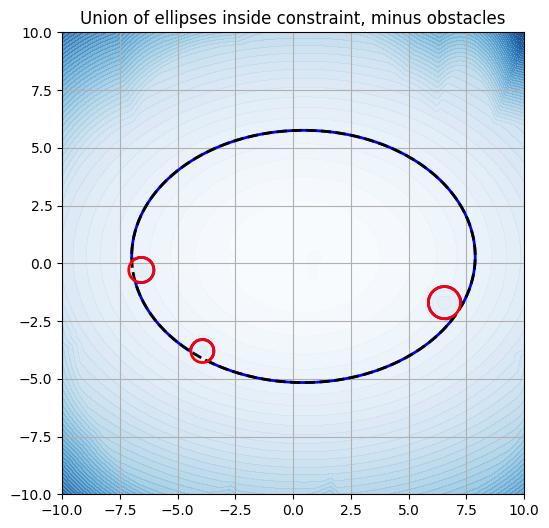

In [32]:
def constraint_with_obstacles(grid, n_ellipses=5, n_obstacles=3, rng=None):
    if rng is None:
        rng = np.random.default_rng()

    # ── Original constraint: one large ellipse ────────────────────────────────
    center_main = rng.uniform(-1.0, 1.0, size=grid.dims)
    semi_main   = rng.uniform(5.0, 8.0,  size=grid.dims)
    original_constraint = ShapeEllipsoid(grid,
                                         center=center_main.tolist(),
                                         semiAxLen=semi_main.tolist())
    print(f"  [original]   Ellipsoid | center={np.round(center_main,2).tolist()} | semi={np.round(semi_main,2).tolist()}")

    # ── Small obstacles: cylinders that intersect the constraint ──────────────
    obstacles = []
    for k in range(n_obstacles):
        # Sample center inside the constraint (inside = negative SDF)
        # Rejection sample until we find a center inside the original constraint
        for _ in range(200):
            c = rng.uniform(grid.min, grid.max)
            # Bilinear lookup of SDF value at c
            ix = int((c[0] - grid.min[0]) / (grid.max[0] - grid.min[0]) * (grid.pts_each_dim[0] - 1))
            iy = int((c[1] - grid.min[1]) / (grid.max[1] - grid.min[1]) * (grid.pts_each_dim[1] - 1))
            ix = np.clip(ix, 0, grid.pts_each_dim[0] - 1)
            iy = np.clip(iy, 0, grid.pts_each_dim[1] - 1)
            if original_constraint[ix, iy] < 0 and original_constraint[ix, iy] > -0.2:   # inside the constraint
                break
        r   = rng.uniform(0.5, 1.5)
        obs = CylinderShape(grid, ignore_dims=[], center=c.tolist(), radius=r)
        obstacles.append(obs)
        print(f"  [obstacle {k}] CylinderShape | center={np.round(c,2).tolist()} | radius={r:.2f}")

    # ── Small ellipses: sampled inside the constraint ─────────────────────────
    ellipses = []
    for k in range(n_ellipses):
        for _ in range(200):
            c = rng.uniform(grid.min, grid.max)
            ix = np.clip(int((c[0] - grid.min[0]) / (grid.max[0] - grid.min[0]) * (grid.pts_each_dim[0] - 1)), 0, grid.pts_each_dim[0]-1)
            iy = np.clip(int((c[1] - grid.min[1]) / (grid.max[1] - grid.min[1]) * (grid.pts_each_dim[1] - 1)), 0, grid.pts_each_dim[1]-1)
            if original_constraint[ix, iy] < 0:
                break
        semi = rng.uniform(1.0, 4.0, size=grid.dims)
        ell  = ShapeEllipsoid(grid, center=c.tolist(), semiAxLen=semi.tolist())
        ellipses.append(ell)
        print(f"  [ellipse  {k}] Ellipsoid     | center={np.round(c,2).tolist()} | semi={np.round(semi,2).tolist()}")

    # ── SDF algebra ───────────────────────────────────────────────────────────

    # 1. Union of all small ellipses
    union_ellipses = ellipses[0]
    for ell in ellipses[1:]:
        union_ellipses = np.minimum(union_ellipses, ell)

    # 2. Intersect with original constraint  (keep only what's inside both)
    inside_constraint = np.maximum(union_ellipses, original_constraint)

    # 3. Subtract each obstacle  (remove anything inside an obstacle)
    #    Inside obstacle: obs_sdf < 0  →  negate to flip, then take max
    result = inside_constraint
    for obs in obstacles:
        result = np.maximum(result, -obs)


    return result, original_constraint, obstacles


rng = np.random.default_rng()
result_sdf, constraint_sdf, obstacle_sdfs = constraint_with_obstacles(g_hires, n_ellipses=100, n_obstacles=3, rng=rng)

x_axis = np.linspace(g_hires.min[0], g_hires.max[0], g_hires.pts_each_dim[0])
y_axis = np.linspace(g_hires.min[1], g_hires.max[1], g_hires.pts_each_dim[1])
X, Y   = np.meshgrid(x_axis, y_axis, indexing='ij')

fig, ax = plt.subplots(figsize=(6, 6))
ax.contourf(X, Y, result_sdf, levels=50, cmap='Blues', alpha=0.7)
ax.contour(X, Y, result_sdf,      levels=[0], colors='blue',   linewidths=2,         label='result boundary')
ax.contour(X, Y, constraint_sdf,  levels=[0], colors='black',  linewidths=2, linestyles='--', label='original constraint')
for obs in obstacle_sdfs:
    ax.contour(X, Y, obs,         levels=[0], colors='red',    linewidths=2,         label='obstacle')
ax.set_aspect('equal'); ax.grid(True)
ax.set_title('Union of ellipses inside constraint, minus obstacles')
plt.show()




In [23]:
%cc can you add the play button so the animation automatically play

✅ Continuing Claude session with execution results...

🤖 Claude wants to execute code
------------------------------------------------------------
📋 To approve: Run the cell below
➡️ To continue Claude agentically afterward: Run %cc

⏺ CreateNotebookCell


💭 Claude: Added a `widgets.Play` button linked to the slider via `jslink`. The play/pause/stop controls advance the slider automatically every 300 ms. You can still drag the slider manually while paused. Adjust `interval` (in ms) to speed up or slow down playback.

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

# ── 1. Run FNO inference on the constraint_with_obstacles SDF ──────────────
# Negate: training convention is that the safe interior is the negative region
_, pred_result = HJR_FNO2d_SuperResQuery(
    g            = g_hires,
    sdf_input    = -result_sdf,
    time_hyparam = time_hyparam,
    model        = model,
)
pred_np = pred_result.numpy()   # (Nx, Ny, T)
T_frames = pred_np.shape[2]

x_ax = np.linspace(g_hires.min[0], g_hires.max[0], g_hires.pts_each_dim[0])
y_ax = np.linspace(g_hires.min[1], g_hires.max[1], g_hires.pts_each_dim[1])
X, Y = np.meshgrid(x_ax, y_ax, indexing='ij')

# Fix color scale across all time steps
vmin, vmax = pred_np.min(), pred_np.max()

# ── 2. Interactive slider ──────────────────────────────────────────────────
out = widgets.Output()

def plot_frame(t_idx):
    with out:
        out.clear_output(wait=True)
        fig, ax = plt.subplots(figsize=(7, 7))

        ax.contourf(X, Y, pred_np[:, :, t_idx], levels=50, cmap='Blues',
                    vmin=vmin, vmax=vmax, alpha=0.85)
        ax.contour(X, Y, pred_np[:, :, t_idx], levels=[0],
                   colors='blue', linewidths=2)
        ax.contour(X, Y, result_sdf, levels=[0],
                   colors='red', linewidths=2, linestyles='--')
        ax.contour(X, Y, constraint_sdf, levels=[0],
                   colors='black', linewidths=2, linestyles=':')

        ax.set_title(f'Reachable Set (BRS) | t = {time_hyparam[t_idx]:.3f} s', fontsize=13)
        ax.set_xlabel('x'); ax.set_ylabel('y')
        ax.set_aspect('equal'); ax.grid(True)
        ax.legend(handles=[
            plt.Line2D([0],[0], color='blue',  lw=2,          label='BRS boundary (V=0)'),
            plt.Line2D([0],[0], color='red',   lw=2, ls='--', label='Safe set (result SDF)'),
            plt.Line2D([0],[0], color='black', lw=2, ls=':',  label='Original constraint'),
        ], loc='upper right', fontsize=9)
        plt.tight_layout()
        plt.show()

slider = widgets.IntSlider(
    value=0, min=0, max=T_frames - 1, step=1,
    description='Time idx',
    continuous_update=False,
    style={'description_width': 'initial'},
    layout=widgets.Layout(width='550px'),
)
time_label = widgets.Label(value=f't = {time_hyparam[0]:.3f} s')

def on_slider_change(change):
    time_label.value = f't = {time_hyparam[change["new"]]:.3f} s'

slider.observe(on_slider_change, names='value')

widgets.interactive_output(plot_frame, {'t_idx': slider})
display(widgets.VBox([widgets.HBox([slider, time_label]), out]))


In [21]:


sdf_hires = result_sdf

################################################################
#  FNO prediction at super-resolution
################################################################
_, pred_reshaped = HJR_FNO2d_SuperResQuery(
    g            = g_hires,
    sdf_input    = -sdf_hires,
    time_hyparam = time_hyparam,
    model        = model,
)
# pred_reshaped: (100, 100, T)
print(f"Prediction shape: {pred_reshaped.shape}")

################################################################
#  Animation: reachable set over time with SDF boundary
################################################################
x_axis = np.linspace(g_hires.min[0], g_hires.max[0], g_hires.pts_each_dim[0])
y_axis = np.linspace(g_hires.min[1], g_hires.max[1], g_hires.pts_each_dim[1])
X, Y   = np.meshgrid(x_axis, y_axis, indexing='ij')

T      = pred_reshaped.shape[2]
pred_np = pred_reshaped.numpy()   # (100, 100, T)

vmin = pred_np.min()
vmax = pred_np.max()

fig, ax = plt.subplots(figsize=(6, 6))

# Initial frame
cf   = ax.contourf(X, Y, pred_np[:, :, 0], levels=50,
                   cmap='Blues', vmin=vmin, vmax=vmax, alpha=0.85)
ct   = ax.contour(X, Y,  pred_np[:, :, 0], levels=[0],
                  colors='blue', linewidths=2)
# SDF constraint boundary — fixed across all frames
ax.contour(X, Y, sdf_hires, levels=[0],
           colors='red', linewidths=2, linestyles='--')

cbar  = plt.colorbar(cf, ax=ax, fraction=0.046, pad=0.04, label='Value Function')
title = ax.set_title(f"FNO2d Predicted BRS | t = {time_hyparam[0]:.3f}")
ax.set_xlabel("x"); ax.set_ylabel("y")
ax.set_xlim(x_axis[0], x_axis[-1])
ax.set_ylim(y_axis[0], y_axis[-1])
ax.set_aspect('equal'); ax.grid(True)

ax.legend(handles=[
    plt.Line2D([0],[0], color='blue', lw=2,        label='BRS boundary (pred)'),
    plt.Line2D([0],[0], color='red',  lw=2, ls='--', label='Constraint boundary'),
], loc='upper right', fontsize=9)

def update(t_i):
    global ct
    ax.clear()

    ax.contourf(X, Y, pred_np[:, :, t_i], levels=50,
                cmap='Blues', vmin=vmin, vmax=vmax, alpha=0.85)
    ax.contour(X, Y, pred_np[:, :, t_i], levels=[0],
               colors='blue', linewidths=2)
    ax.contour(X, Y, sdf_hires, levels=[0],
               colors='red', linewidths=2, linestyles='--')

    ax.set_title(f"FNO2d Predicted BRS | t = {time_hyparam[t_i]:.3f}")
    ax.set_xlabel("x"); ax.set_ylabel("y")
    ax.set_xlim(x_axis[0], x_axis[-1])
    ax.set_ylim(y_axis[0], y_axis[-1])
    ax.set_aspect('equal'); ax.grid(True)
    ax.legend(handles=[
        plt.Line2D([0],[0], color='blue', lw=2,          label='BRS boundary (pred)'),
        plt.Line2D([0],[0], color='red',  lw=2, ls='--', label='Constraint boundary'),
    ], loc='upper right', fontsize=9)

    return []

ani = animation.FuncAnimation(
    fig, update,
    frames=T,
    interval=150,    # ms between frames
    blit=False
)

# ---- Display in notebook ---------------------------------------------------
from IPython.display import HTML
plt.close(fig)   # prevent static plot from showing alongside animation
HTML(ani.to_jshtml())

Prediction shape: torch.Size([200, 200, 41])


### L-inf bound

In [ ]:
import scipy.io
import numpy as np

# ── Load test data ────────────────────────────────────────────────────────────
TEST_PATH = '/home/kmuenpra/git/tTLT/Plane2D_Until_u[neg1_1]_d[neg01_01]_TEST.mat'
mat = scipy.io.loadmat(TEST_PATH)

constraints = np.array(mat['constraints'], dtype=np.float32)  # (M, 50, 50)
results     = np.array(mat['results'],     dtype=np.float32)  # (M, 50, 50, T)
tau         = np.array(mat['tau'],         dtype=np.float32).ravel()  # (T,)

M_test = constraints.shape[0]
T      = len(tau) - 20
print(f"M_test={M_test}, T={T}")

# ── Evaluate L-inf per sample per time slice ──────────────────────────────────
linf_errors = np.zeros((M_test, T), dtype=np.float32)  # (M_test, T)

for i in range(M_test):
    _, pred_tensor = HJR_FNO2d_SuperResQuery(g, -constraints[i], tau[:T], model)
    pred_i = pred_tensor.numpy()                  # (50, 50, T)
    abs_err = np.abs(pred_i - results[i][..., :T])         # (50, 50, T)
    linf_errors[i] = abs_err.max(axis=(0, 1))     # (T,)

# ── Aggregate ─────────────────────────────────────────────────────────────────
mean_linf_per_t = linf_errors.mean(axis=0)        # (T,)
max_linf_per_t  = linf_errors.max(axis=0)         # (T,)
global_linf     = float(linf_errors.max())

worst_sample, worst_t = np.unravel_index(linf_errors.argmax(), linf_errors.shape)

# ── Report ────────────────────────────────────────────────────────────────────
print(f"\n{'t-idx':>6}  {'tau':>8}  {'mean L-inf':>12}  {'max L-inf':>12}")
print(f"{'-'*6}  {'-'*8}  {'-'*12}  {'-'*12}")
for ti in range(T):
    print(f"{ti:6d}  {tau[ti]:8.4f}  {mean_linf_per_t[ti]:12.6f}  {max_linf_per_t[ti]:12.6f}")

print(f"\nGlobal L-inf (max over all samples, all t, all grid pts): {global_linf:.6f}")
print(f"Worst sample: {worst_sample},  worst t-idx: {worst_t} (tau={tau[worst_t]:.4f})")

In [ ]:
results[0][...,:(T+1)].shape

### ignore the rest below

In [ ]:
from typing import Tuple, List, Dict, Union


#---------------------------------------
# Derivative Function from HelperOC Toolbox
# https://github.com/HJReachability/helperOC
#---------------------------------------

def upwindFirstENO2(grid: Grid, data: np.ndarray, dim: int) -> Tuple[np.ndarray, np.ndarray]:
    """Second order ENO approximation of first derivative"""
    dxInv = 1.0 / grid.dx[dim]
    
    # Add ghost cells (simple periodic or extrapolation)
    stencil = 2
    gdata = add_ghost_cells(data, dim, stencil)
    
    # First divided differences
    D1 = dxInv * np.diff(gdata, axis=dim)
    
    # Second divided differences
    D2 = 0.5 * dxInv * np.diff(D1, axis=dim)
    
    # Strip extra entries from D1
    D1 = strip_dim(D1, dim, 1, 1)
    
    # Create left and right approximations
    derivL = strip_dim(D1, dim, 0, 1)
    derivR = strip_dim(D1, dim, 1, 0)
    
    # Add second order corrections
    D2_left = strip_dim(D2, dim, 0, 2)
    D2_right = strip_dim(D2, dim, 1, 1)
    
    derivL = derivL + grid.dx[dim] * D2_left
    derivR = derivR - grid.dx[dim] * D2_right
    
    return derivL, derivR


def upwindFirstWENO5(grid: Grid, data: np.ndarray, dim: int) -> Tuple[np.ndarray, np.ndarray]:
    """Fifth order WENO approximation - simplified implementation"""
    dxInv = 1.0 / grid.dx[dim]
    stencil = 3
    
    # Add ghost cells
    gdata = add_ghost_cells(data, dim, stencil)
    
    # Compute first divided differences
    D1 = dxInv * np.diff(gdata, axis=dim)
    
    # For simplicity, use second order ENO as base
    derivL, derivR = upwindFirstENO2(grid, data, dim)
    
    return derivL, derivR


def add_ghost_cells(data: np.ndarray, dim: int, stencil: int) -> np.ndarray:
    """Add ghost cells by extrapolation or periodic boundary"""
    # Simple extrapolation for ghost cells
    shape = list(data.shape)
    shape[dim] += 2 * stencil
    
    gdata = np.zeros(shape)
    
    # Copy original data
    slices = [slice(None)] * data.ndim
    slices[dim] = slice(stencil, -stencil)
    gdata[tuple(slices)] = data
    
    # Extrapolate boundaries
    for i in range(stencil):
        # Left boundary
        slices_src = [slice(None)] * data.ndim
        slices_src[dim] = stencil
        slices_dst = [slice(None)] * data.ndim
        slices_dst[dim] = stencil - i - 1
        gdata[tuple(slices_dst)] = gdata[tuple(slices_src)]
        
        # Right boundary
        slices_src[dim] = -stencil - 1
        slices_dst[dim] = -stencil + i
        gdata[tuple(slices_dst)] = gdata[tuple(slices_src)]
    
    return gdata


def strip_dim(data: np.ndarray, dim: int, left: int, right: int) -> np.ndarray:
    """Strip entries from left and right along dimension"""
    slices = [slice(None)] * data.ndim
    slices[dim] = slice(left, -right if right > 0 else None)
    return data[tuple(slices)]


def computeGradients(grid: Grid, data: np.ndarray) -> List[np.ndarray]:
    """Compute gradients using upwind scheme"""
    derivC = []
    
    for dim in range(grid.dim):
        derivL, derivR = upwindFirstWENO5(grid, data, dim)
        # Central difference
        deriv = 0.5 * (derivL + derivR)
        derivC.append(deriv)
    
    return derivC


def extract_circle_from_sdf(sdf, x_range=(-1,1), y_range=(-1,1)):
    """
    Recover center and radius from a 2D Euclidean signed distance field.

    Parameters
    ----------
    sdf (2D slice) : (H,W) ndarray
        Signed distance field (negative inside).
    x_range : tuple
        (xmin, xmax) of grid
    y_range : tuple
        (ymin, ymax) of grid

    Returns
    -------
    np.array([cx, cy, r])
    """

    H, W = sdf.shape

    # Construct grid coordinates
    xs = np.linspace(x_range[0], x_range[1], H)
    ys = np.linspace(y_range[0], y_range[1], W)
    X, Y = np.meshgrid(xs, ys, indexing="ij")

    dx = xs[1] - xs[0]
    dy = ys[1] - ys[0]

    # ---- 1) Radius from minimum value ----
    min_idx = np.unravel_index(np.argmin(sdf), sdf.shape)
    r = -sdf[min_idx]

    # ---- 2) Compute gradient via central difference ----
    grad_x = np.zeros_like(sdf)
    grad_y = np.zeros_like(sdf)

    grad_x[1:-1, :] = (sdf[2:, :] - sdf[:-2, :]) / (2 * dx)
    grad_y[:, 1:-1] = (sdf[:, 2:] - sdf[:, :-2]) / (2 * dy)

    # Use interior point near minimum
    i, j = min_idx
    px = grad_x[i, j]
    py = grad_y[i, j]

    # Coordinate of that point
    x0 = X[i, j]
    y0 = Y[i, j]

    # ---- 3) Recover center ----
    cx = x0 - sdf[i, j] * px
    cy = y0 - sdf[i, j] * py

    return np.array([cx, cy, r])



In [ ]:
model = torch.load('/home/kmuenpra/git/HJR-FNO-ContingencyPlanning/test/model/hjrno_dubins_PlaneDisturb_3000', weights_only=False)

L-inf norm

In [ ]:
import numpy as np


# -----------------------------------------------------------
#  L∞ value error
# -----------------------------------------------------------
def compute_value_error(V_true, V_theta):
    """
    sup |V_theta - V_true|
    """
    return np.max(np.abs(V_theta - V_true))


# -----------------------------------------------------------
#  Time derivative L∞ error
# -----------------------------------------------------------
def compute_time_derivative_error(V_true, V_theta, time_grid):
    """
    sup |∂t V_theta - ∂t V_true|
    """
    dt = time_grid[1] - time_grid[0]

    dVdt_true  = (V_true[..., 1:]  - V_true[..., :-1])  / dt
    dVdt_theta = (V_theta[..., 1:] - V_theta[..., :-1]) / dt

    return np.max(np.abs(dVdt_theta - dVdt_true))


# -----------------------------------------------------------
#  Spatial gradient L∞ error
# -----------------------------------------------------------
def compute_spatial_gradient_error(g, V_true, V_theta, sdf_input, theta_hyparam, time_hyparam):
    """
    Computes:
        sup ||∇_{x,y,θ} V_theta - ∇_{x,y,θ} V||_2
    """
    Nt = V_true.shape[-1]
    grad_err = 0.0
    
    # #Define Grid (finer resolution)
    # grid_min = np.array([-10.0, -10.0, 0])
    # grid_max = np.array([10.0, 10.0, 2*math.pi])
    # N_fine = np.array([99, 99, 25])
    # pd=[2] #periodic
    # g_fine = Grid(grid_min, grid_max, N_fine, pd)

    for k in range(Nt):
        
        if k%4 ==0:

            Grad_true  = computeGradients(g, V_true[..., k])
            
            # #Redine V_theta with zero-shot super resolution
            # obs_cir = extract_circle_from_sdf(sdf_input[...,0], x_range=(-10,10), y_range=(-10,10))
            # sdf_fine = shapeCylinder(g_fine, ignoreDims=pd, center=[obs_cir[0], obs_cir[1]], radius=obs_cir[2])
            # _, V_theta_fine = HJR_FNO_SingleQuery(
            #     g_fine,
            #     sdf_fine,
            #     theta_hyparam,
            #     time_hyparam,
            # )
            # Grad_theta = computeGradients(g_fine, V_theta_fine[..., k])
            
            # # #Down sample Grad_theta to original size of training data
            # # target_H = len(g.vs[0])
            # # target_W = len(g.vs[1])

            # # orig_H = len(g_fine.vs[0])
            # # orig_W = len(g_fine.vs[1])

            # # idx_x = np.linspace(0, orig_H - 1, target_H).astype(int)
            # # idx_y = np.linspace(0, orig_W - 1, target_W).astype(int)
            
            # Grad_theta_coarse = [
            #     g[::2, ::2, :]
            #     for g in Grad_theta
            # ]
            # gx = Grad_theta_coarse[0] - Grad_true[0]
            # gy = Grad_theta_coarse[1] - Grad_true[1]
            # gθ = Grad_theta_coarse[2] - Grad_true[2]
            
            
            #Original
            Grad_theta = computeGradients(g, V_theta[..., k])
            gx = Grad_theta[0] - Grad_true[0]
            gy = Grad_theta[1] - Grad_true[1]
            gθ = Grad_theta[2] - Grad_true[2]
            
            # print(np.argmax([np.max(gx), np.max(gy), np.max(gθ)]))

            # pointwise Euclidean norm
            pointwise_norm = np.sqrt(gx**2 + gy**2 + gθ**2)

            grad_err = max(grad_err, np.max(pointwise_norm))

    return grad_err


# -----------------------------------------------------------
#  Proper W^{1,∞} estimator
# -----------------------------------------------------------
def estimate_W1_infty_error(
    g,
    V_true,
    V_theta,
    theta_grid,
    time_grid,
    sdf_input,
    include_time_derivative=True
):
    """
    Returns discrete approximation of W^{1,∞} norm.
    """

    eps_0 = compute_value_error(V_true, V_theta)
    eps_x = compute_spatial_gradient_error(g, V_true, V_theta, sdf_input, theta_grid, time_hyparam)

    if include_time_derivative:
        eps_t = compute_time_derivative_error(V_true, V_theta, time_grid)
        eps_total = max(eps_0, eps_x, eps_t)
    else:
        eps_t = None
        eps_total = max(eps_0, eps_x)

    return {
        "value_error"        : eps_0,
        "time_deriv_error"   : eps_t,
        "spatial_grad_error" : eps_x,
        "W1_infty_estimate"  : eps_total
    }
    
    
def evaluate_dataset_W1_infty(
    g,
    x_data,          # (NUMTEST, 50, 50, 25)
    y_data,          # (NUMTEST, 50, 50, 25, 21)
    theta_hyparam,
    time_hyparam,
    include_time_derivative=False   # ← default OFF (recommended)
):
    NUMTEST = x_data.shape[0]

    value_errs  = np.zeros(NUMTEST)
    grad_errs   = np.zeros(NUMTEST)
    total_errs  = np.zeros(NUMTEST)

    if include_time_derivative:
        time_errs = np.zeros(NUMTEST)
    else:
        time_errs = None

    for i in range(NUMTEST):
        
        if i in [63]:
            continue

        print(f"[{i+1}/{NUMTEST}] Evaluating sample {i}")

        sdf_input = x_data[i]
        V_true    = y_data[i]
        
        # ---------------------------------------------
        # Predict reachable set
        # ---------------------------------------------
        _, V_theta = HJR_FNO_SingleQuery(
            g,
            sdf_input,
            theta_hyparam,
            time_hyparam
        )

        V_theta = V_theta.detach().cpu().numpy()

        # sanity check
        assert V_theta.shape == V_true.shape, \
            f"Shape mismatch: {V_theta.shape} vs {V_true.shape}"

        # ---------------------------------------------
        # Compute W^{1,∞} components
        # ---------------------------------------------
        errs = estimate_W1_infty_error(
            g,
            V_true,
            V_theta,
            theta_hyparam,
            time_hyparam,
            sdf_input,
            include_time_derivative=include_time_derivative
        )

        value_errs[i] = errs["value_error"]
        grad_errs[i]  = errs["spatial_grad_error"]
        total_errs[i] = errs["W1_infty_estimate"]

        if include_time_derivative:
            time_errs[i] = errs["time_deriv_error"]

    result = {
        "value_error": value_errs,
        "spatial_grad_error": grad_errs,
        "W1_infty_error": total_errs,
    }

    if include_time_derivative:
        result["time_deriv_error"] = time_errs

    return result


errs = evaluate_dataset_W1_infty(
    g,
    x_data[train_idx, ...],
    y_data[train_idx, ...],
    theta_hyparam,
    time_hyparam,
    include_time_derivative=False
)

    
print("========== Dataset Summary ==========")

print("L∞ value error:")
print("  max :", np.max(errs["value_error"]))
print("  mean:", np.mean(errs["value_error"]))

print("Spatial gradient error:")
print("  max :", np.max(errs["spatial_grad_error"]))
print("  mean:", np.mean(errs["spatial_grad_error"]))

if "time_deriv_error" in errs:
    print("Time derivative error:")
    print("  max :", np.max(errs["time_deriv_error"]))
    print("  mean:", np.mean(errs["time_deriv_error"]))

print("W^{1,∞} total error:")
print("  max :", np.max(errs["W1_infty_error"]))
print("  mean:", np.mean(errs["W1_infty_error"]))

worst_idx = np.argmax(errs["W1_infty_error"])
print("Worst-case sample index:", worst_idx)






Set Inclusion 

In [ ]:
import numpy as np

############################################################
# Inclusion per time (3D reachable set)
############################################################
def inclusion_per_time_3d(V_true, V_pred, eps=0.0):
    """
    Compute inclusion for each time slice.
    Reachable set is 3D (x,y,theta) at fixed time.

    Returns:
        inclusion_time : array of size [Nt]
        vol_pred_time  : array of size [Nt]
        vol_int_time   : array of size [Nt]
    """

    true_mask = V_true <= 0
    pred_mask = V_pred <= eps

    intersection = np.logical_and(true_mask, pred_mask)

    # Sum over x,y,theta (axes 0,1,2)
    vol_pred_time = np.sum(pred_mask, axis=(0,1,2))
    vol_int_time  = np.sum(intersection, axis=(0,1,2))

    Nt = vol_pred_time.shape[0]
    inclusion_time = np.zeros(Nt)

    for k in range(Nt):
        if vol_pred_time[k] == 0:
            inclusion_time[k] = 1.0 if np.sum(true_mask[..., k]) == 0 else 0.0
        else:
            inclusion_time[k] = vol_int_time[k] / vol_pred_time[k]

    return inclusion_time, vol_pred_time, vol_int_time

In [ ]:
epsilon = -0.43098543294802605#-0.6155067230464348

NUMTEST = len(x_data)

all_time_strict = []
all_time_eps    = []

for i in range(NUMTEST):

    print(f"[{i+1}/{NUMTEST}] Evaluating sample {i}")

    sdf_input = x_data[i]
    V_true    = y_data[i]

    _, V_theta = HJR_FNO_SingleQuery(
        g, sdf_input, theta_hyparam, time_hyparam
    )
    V_theta = V_theta.detach().cpu().numpy()

    ########################################################
    # Strict inclusion per time
    ########################################################
    inc_time_strict, _, _ = inclusion_per_time_3d(
        V_true, V_theta, eps=0.0
    )

    ########################################################
    # Epsilon inclusion per time
    ########################################################
    inc_time_eps, _, _ = inclusion_per_time_3d(
        V_true, V_theta, eps=epsilon
    )

    print("   Mean Strict (over time):  ",
          np.mean(inc_time_strict))
    print("   Mean Epsilon (over time): ",
          np.mean(inc_time_eps))

    all_time_strict.append(inc_time_strict)
    all_time_eps.append(inc_time_eps)

In [ ]:
all_time_strict = np.array(all_time_strict)  # [Nsamples, Nt]
all_time_eps    = np.array(all_time_eps)

# Average over dataset
mean_time_strict = np.mean(all_time_strict, axis=0)
mean_time_eps    = np.mean(all_time_eps, axis=0)

# Global time-averaged inclusion
mean_strict_overall = np.mean(mean_time_strict)
mean_eps_overall    = np.mean(mean_time_eps)

print("\n================ FINAL RESULTS ================")
print("Mean Strict Inclusion (overall): ", mean_strict_overall)
print("Mean Epsilon Inclusion (overall):", mean_eps_overall)
print("===============================================")

L2 Gradient Norm

In [ ]:
import numpy as np


# -----------------------------------------------------------
#  L2 value error
# -----------------------------------------------------------
def compute_value_error_L2(V_true, V_theta):
    """
    ||V_theta - V_true||_L2
    """
    return np.sqrt(np.mean((V_theta - V_true) ** 2))


# -----------------------------------------------------------
#  Time derivative L2 error
# -----------------------------------------------------------
def compute_time_derivative_error_L2(V_true, V_theta, time_grid):
    """
    ||∂t V_theta - ∂t V_true||_L2
    """
    dt = time_grid[1] - time_grid[0]

    dVdt_true  = (V_true[..., 1:]  - V_true[..., :-1])  / dt
    dVdt_theta = (V_theta[..., 1:] - V_theta[..., :-1]) / dt

    return np.sqrt(np.mean((dVdt_theta - dVdt_true) ** 2))


# -----------------------------------------------------------
#  Spatial gradient L2 error
# -----------------------------------------------------------
def compute_spatial_gradient_error_L2(g, V_true, V_theta, sdf_input, theta_hyparam, time_hyparam):
    """
    Computes:
        ||∇_{x,y,θ} V_theta - ∇_{x,y,θ} V||_L2
    i.e. sqrt( mean over all points of ||grad_error||_2^2 )
    """
    Nt = V_true.shape[-1]
    sq_sum = 0.0
    count  = 0



    for k in range(Nt):

        if k % 4 == 0:

            Grad_true = computeGradients(g, V_true[..., k])
            Grad_theta = computeGradients(g, V_theta[..., k])

            gx = Grad_theta[0] - Grad_true[0]
            gy = Grad_theta[1] - Grad_true[1]
            gθ = Grad_theta[2] - Grad_true[2]

            # Squared pointwise Euclidean norm, accumulated for global mean
            sq_sum += np.sum(gx**2 + gy**2 + gθ**2)
            count  += gx.size

    return np.sqrt(sq_sum / count) if count > 0 else 0.0


# -----------------------------------------------------------
#  Proper W^{1,2} estimator
# -----------------------------------------------------------
def estimate_W1_2_error(
    g,
    V_true,
    V_theta,
    theta_grid,
    time_grid,
    sdf_input,
    include_time_derivative=True
):
    """
    Returns discrete approximation of W^{1,2} (H1-like) norm:
        sqrt( ||V_theta - V_true||^2_L2 + ||∇V_theta - ∇V_true||^2_L2 [+ ||∂t V_theta - ∂t V_true||^2_L2] )
    """
    eps_0 = compute_value_error_L2(V_true, V_theta)
    eps_x = compute_spatial_gradient_error_L2(g, V_true, V_theta, sdf_input, theta_grid, time_hyparam)

    if include_time_derivative:
        eps_t = compute_time_derivative_error_L2(V_true, V_theta, time_grid)
        eps_total = np.sqrt(eps_0**2 + eps_x**2 + eps_t**2)
    else:
        eps_t = None
        eps_total = np.sqrt(eps_0**2 + eps_x**2)

    return {
        "value_error"        : eps_0,
        "time_deriv_error"   : eps_t,
        "spatial_grad_error" : eps_x,
        "W1_2_estimate"      : eps_total
    }


# def evaluate_dataset_W1_2(
#     g,
#     x_data,          # (NUMTEST, 50, 50, 25)
#     y_data,          # (NUMTEST, 50, 50, 25, 21)
#     theta_hyparam,
#     time_hyparam,
#     include_time_derivative=False
# ):
#     NUMTEST = x_data.shape[0]

#     value_errs = np.zeros(NUMTEST)
#     grad_errs  = np.zeros(NUMTEST)
#     total_errs = np.zeros(NUMTEST)

#     if include_time_derivative:
#         time_errs = np.zeros(NUMTEST)
#     else:
#         time_errs = None

#     for i in range(NUMTEST):


#         print(f"[{i+1}/{NUMTEST}] Evaluating sample {i}")

#         sdf_input = x_data[i]
#         V_true    = y_data[i]

#         _, V_theta = HJR_FNO_SingleQuery(g, sdf_input, theta_hyparam, time_hyparam)
#         V_theta = V_theta.detach().cpu().numpy()

#         assert V_theta.shape == V_true.shape, \
#             f"Shape mismatch: {V_theta.shape} vs {V_true.shape}"

#         errs = estimate_W1_2_error(
#             g,
#             V_true,
#             V_theta,
#             theta_hyparam,
#             time_hyparam,
#             sdf_input,
#             include_time_derivative=include_time_derivative
#         )

#         value_errs[i] = errs["value_error"]
#         grad_errs[i]  = errs["spatial_grad_error"]
#         total_errs[i] = errs["W1_2_estimate"]

#         if include_time_derivative:
#             time_errs[i] = errs["time_deriv_error"]

#     result = {
#         "value_error"       : value_errs,
#         "spatial_grad_error": grad_errs,
#         "W1_2_error"        : total_errs,
#     }

#     if include_time_derivative:
#         result["time_deriv_error"] = time_errs

#     return result
def evaluate_dataset_W1_2(
    g,
    x_data,
    y_data,
    theta_hyparam,
    time_hyparam,
    include_time_derivative=True
):
    NUMTEST = x_data.shape[0]

    value_errs = np.zeros(NUMTEST)
    grad_errs  = np.zeros(NUMTEST)
    total_errs = np.zeros(NUMTEST)
    time_errs  = np.zeros(NUMTEST)
    ratio_errs = np.zeros(NUMTEST)

    for i in range(NUMTEST):

        print(f"[{i+1}/{NUMTEST}] Evaluating sample {i}")

        sdf_input = x_data[i]
        V_true    = y_data[i]

        _, V_theta = HJR_FNO_SingleQuery(
            g, sdf_input, theta_hyparam, time_hyparam
        )
        V_theta = V_theta.detach().cpu().numpy()

        assert V_theta.shape == V_true.shape, \
            f"Shape mismatch: {V_theta.shape} vs {V_true.shape}"

        errs = estimate_W1_2_error(
            g,
            V_true,
            V_theta,
            theta_hyparam,
            time_hyparam,
            sdf_input,
            include_time_derivative=True
        )

        eps_0 = errs["value_error"]
        eps_x = errs["spatial_grad_error"]
        eps_t = errs["time_deriv_error"]

        value_errs[i] = eps_0
        grad_errs[i]  = eps_x
        time_errs[i]  = eps_t
        total_errs[i] = errs["W1_2_estimate"]

        # ---- dominance ratio ----
        if eps_x > 1e-12:
            ratio_errs[i] = eps_t / (M_f * eps_x)
        else:
            ratio_errs[i] = 0.0

    return {
        "value_error"        : value_errs,
        "spatial_grad_error" : grad_errs,
        "time_deriv_error"   : time_errs,
        "W1_2_error"         : total_errs,
        "ratio"              : ratio_errs
    }


# -----------------------------------------------------------
#  Run & Report
# # -----------------------------------------------------------
# errs = evaluate_dataset_W1_2(
#     g,
#     x_data[train_idx, ...],
#     y_data[train_idx, ...],
#     theta_hyparam,
#     time_hyparam,
#     include_time_derivative=True
# )

# print("========== Dataset Summary (W^{1,2}) ==========")

# print("L2 value error:")
# print("  max :", np.max(errs["value_error"]))
# print("  mean:", np.mean(errs["value_error"]))

# print("Spatial gradient error (L2):")
# print("  max :", np.max(errs["spatial_grad_error"]))
# print("  mean:", np.mean(errs["spatial_grad_error"]))

# if "time_deriv_error" in errs:
#     print("Time derivative error (L2):")
#     print("  max :", np.max(errs["time_deriv_error"]))
#     print("  mean:", np.mean(errs["time_deriv_error"]))

# print("W^{1,2} total error:")
# print("  max :", np.max(errs["W1_2_error"]))
# print("  mean:", np.mean(errs["W1_2_error"]))

# worst_idx = np.argmax(errs["W1_2_error"])
# print("Worst-case sample index:", worst_idx)
errs = evaluate_dataset_W1_2(
    g,
    x_data[train_idx, ...],
    y_data[train_idx, ...],
    theta_hyparam,
    time_hyparam,
    include_time_derivative=True
)

print("========== Dataset Summary (W^{1,2}) ==========")

print("L2 value error:")
print("  max :", np.max(errs["value_error"]))
print("  mean:", np.mean(errs["value_error"]))

print("Spatial gradient error (L2):")
print("  max :", np.max(errs["spatial_grad_error"]))
print("  mean:", np.mean(errs["spatial_grad_error"]))

print("Time derivative error (L2):")
print("  max :", np.max(errs["time_deriv_error"]))
print("  mean:", np.mean(errs["time_deriv_error"]))

print("Dominance ratio ρ = ||∂t e|| / (M_f ||∇e||):")
print("  max :", np.max(errs["ratio"]))
print("  mean:", np.mean(errs["ratio"]))

print("W^{1,2} total error:")
print("  max :", np.max(errs["W1_2_error"]))
print("  mean:", np.mean(errs["W1_2_error"]))

worst_idx = np.argmax(errs["W1_2_error"])
print("Worst-case sample index:", worst_idx)

MSE error 

In [ ]:
import numpy as np

NUMTEST = len(x_data)

mse_all = []

for i in range(NUMTEST):

    print(f"[{i+1}/{NUMTEST}] Evaluating sample {i}")

    sdf_input = x_data[i]
    V_true    = y_data[i]

    # Predict
    _, V_theta = HJR_FNO_SingleQuery(
        g, sdf_input, theta_hyparam, time_hyparam
    )

    V_theta = V_theta.detach().cpu().numpy()

    # Compute MSE for this sample
    mse_i = np.mean((V_theta - V_true)**2)

    mse_all.append(mse_i)

    print(f"  MSE: {mse_i:.6e}")

# Dataset average MSE
mean_mse = np.mean(mse_all)

print("\n===================================")
print(f"Average MSE over dataset: {mean_mse:.6e}")
print("===================================")

In [ ]:
import matplotlib.pyplot as plt
import imageio.v3 as imageio
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib.animation import PillowWriter


def plot_time_series_reachability(g:Grid, x_input, y_pred, y_true=None, gif_name="reachability_anim.gif", fps=5):
    
    
    if isinstance(x_input, torch.Tensor):
            # Move to CPU, detach, convert to numpy
            x_input = x_input.detach().cpu().numpy()
            
    if isinstance(y_pred, torch.Tensor):
            # Move to CPU, detach, convert to numpy
            y_pred = y_pred.detach().cpu().numpy()
            
    if y_true is not None and isinstance(y_true, torch.Tensor):
            # Move to CPU, detach, convert to numpy
            y_true = y_true.detach().cpu().numpy()
            
    
    

    # Create fig once, reuse Axes (hold-on behavior managed in your function)
    fig, ax = plt.subplots(figsize=(6, 5))

    # Build animation writer
    writer = PillowWriter(fps=fps)

    with writer.saving(fig, gif_name, dpi=100):
        
        for i in range(y_pred.shape[-1]):
            ax.clear()  # clear previous frame drawing
            
            #Plot obstacles (SDF input)
            fig, _, _ = plot_levelset_2d(
                g,
                x_input,
                fig=fig,
                level_value=0,
                line_color="red",
                # legend_name="Obstacle"
            )

            #Plot reachable set over time
            reachable_pred = y_pred[...,i]
    
            fig, _, _ = plot_levelset_2d(
                g,
                reachable_pred,
                fig=fig,
                level_value=-0.8,
                line_color="magenta",
                title_txt=f"t = {i+1}",
                # legend_name="FNO-Learned set"
            )
            
            
            fig, _, _ = plot_levelset_2d(
                g,
                reachable_pred,
                fig=fig,
                level_value=0.0,
                line_color="red",
                title_txt=f"t = {i+1}",
                # legend_name="FNO-Learned set"
            )
            
            #Plot True reachable set over time (if provided)
            if y_true is not None:
                
                reachable_true = y_true[...,i]
                
                fig, ax, CS = plot_levelset_2d(
                    g,
                    reachable_true,
                    fig=fig,
                    level_value=0,
                    line_color="green",
                    title_txt=f"t = {i + 1}",
                    # legend_name="True Reachable set"
                )
            

            # Write frame
            writer.grab_frame()

    print(f"Figure saved as: {gif_name}")
    
    
################################################################
# New Query
################################################################
    
#Choose discretization for theta and time
theta_array = np.linspace(0,2*math.pi,25)
time_array = np.linspace(0,8,33)

test_i = 4
x_input = x_test[test_i, ...]
y_true = y_test[test_i, ...]
# y_true = y_true[..., ::-1] #reverse the time index

_, y_pred = HJR_FNO_SingleQuery(g, sdf_input=x_input, theta_hyparam=theta_array, time_hyparam=time_array)



################################################################
# Save GIF
################################################################
import os
gif_filename = "reachable_set_1Obs.gif"  # output GIF file
frame_dir = "fig_results"            # folder to temporarily save frames

save_path = frame_dir + '/' + gif_filename
os.makedirs(frame_dir, exist_ok=True)


#Choose Theta slice for 2D gif
theta_slice = 5
plot_time_series_reachability(g, x_input[...,theta_slice], y_pred[:,:,theta_slice,:], y_true[:,:,theta_slice,:], gif_name=save_path, fps=5)



### Test multiple obstacles

In [ ]:

################################################################
# New Query
################################################################
    
#Choose discretization for theta and time
theta_array = np.linspace(0,2*math.pi,25)
time_array = np.linspace(0,8,33)

test_i = 4
x_input = dataloader1.data['obs_all'][test_i][0]
y_true = dataloader1.data['BRT_all'][test_i][0]
# y_true = y_true[..., ::-1] #reverse the time index

_, y_pred = HJR_FNO_SingleQuery(g, sdf_input=x_input, theta_hyparam=theta_array, time_hyparam=time_array)



################################################################
# Save GIF
################################################################
import os
gif_filename = "reachable_set_MultipleObs.gif"  # output GIF file
frame_dir = "fig_results"            # folder to temporarily save frames

save_path = frame_dir + '/' + gif_filename
os.makedirs(frame_dir, exist_ok=True)


#Choose Theta slice for 2D gif
theta_slice = 10
plot_time_series_reachability(g, x_input[...,theta_slice], y_pred[:,:,theta_slice,:], y_true[:,:,theta_slice,:], gif_name=save_path, fps=5)


### Testing OptCtrl

In [ ]:
from typing import Tuple, List, Dict, Union
from scipy.interpolate import RegularGridInterpolator


#---------------------------------------
# Plane dynamics class
#---------------------------------------        
class Plane:
    
    def __init__(self, x0, wMax, vrange, dMax):
        self.x = np.array(x0, dtype=float)
        self.wMax = wMax
        self.vrange = vrange
        self.dMax = np.array(dMax)
        self.nx = 3
        self.nu = 2
        self.nd = 3
        
    def dynamics(self, t, x, u, d):
        """Compute dynamics: dx/dt = f(x, u, d)"""
        dx = np.zeros(3)
        dx[0] = u[0] * np.cos(x[2]) + d[0]
        dx[1] = u[0] * np.sin(x[2]) + d[1]
        dx[2] = u[1] + d[2]
        return dx
    
    def optCtrl(self, t, x, deriv, uMode='min'):
        """Optimal control"""
        u = np.zeros(2)
        det1 = deriv[0] * np.cos(x[2]) + deriv[1] * np.sin(x[2])
        
        if uMode == 'max':
            u[0] = self.vrange[1] if det1 >= 0 else self.vrange[0]
            u[1] = self.wMax if deriv[2] >= 0 else -self.wMax
        elif uMode == 'min':
            u[0] = self.vrange[0] if det1 >= 0 else self.vrange[1]
            u[1] = -self.wMax if deriv[2] >= 0 else self.wMax
            
        print("det1", det1)
        print("deriv[2]", deriv[2])
        
        return u
    
    def optDstb(self, t, x, deriv, dMode='max'):
        """Optimal disturbance"""
        d = np.zeros(3)
        normDeriv12 = np.sqrt(deriv[0]**2 + deriv[1]**2)
        
        if normDeriv12 > 0:
            if dMode == 'max':
                d[0] = self.dMax[0] * deriv[0] / normDeriv12
                d[1] = self.dMax[1] * deriv[1] / normDeriv12
            elif dMode == 'min':
                d[0] = -self.dMax[0] * deriv[0] / normDeriv12
                d[1] = -self.dMax[1] * deriv[1] / normDeriv12
        
        if dMode == 'max':
            d[2] = self.dMax[2] if deriv[2] >= 0 else -self.dMax[2]
        elif dMode == 'min':
            d[2] = -self.dMax[2] if deriv[2] >= 0 else self.dMax[2]
        
        return d
    
    def updateState(self, u, dt, d):
        """Update state using Euler integration"""
        dx = self.dynamics(0, self.x, u, d)
        self.x = self.x + dx * dt
        
#---------------------------------------
# Derivative Function from HelperOC Toolbox
# https://github.com/HJReachability/helperOC
#---------------------------------------

def upwindFirstENO2(grid: Grid, data: np.ndarray, dim: int) -> Tuple[np.ndarray, np.ndarray]:
    """Second order ENO approximation of first derivative"""
    dxInv = 1.0 / grid.dx[dim]
    
    # Add ghost cells (simple periodic or extrapolation)
    stencil = 2
    gdata = add_ghost_cells(data, dim, stencil)
    
    # First divided differences
    D1 = dxInv * np.diff(gdata, axis=dim)
    
    # Second divided differences
    D2 = 0.5 * dxInv * np.diff(D1, axis=dim)
    
    # Strip extra entries from D1
    D1 = strip_dim(D1, dim, 1, 1)
    
    # Create left and right approximations
    derivL = strip_dim(D1, dim, 0, 1)
    derivR = strip_dim(D1, dim, 1, 0)
    
    # Add second order corrections
    D2_left = strip_dim(D2, dim, 0, 2)
    D2_right = strip_dim(D2, dim, 1, 1)
    
    derivL = derivL + grid.dx[dim] * D2_left
    derivR = derivR - grid.dx[dim] * D2_right
    
    return derivL, derivR


def upwindFirstWENO5(grid: Grid, data: np.ndarray, dim: int) -> Tuple[np.ndarray, np.ndarray]:
    """Fifth order WENO approximation - simplified implementation"""
    dxInv = 1.0 / grid.dx[dim]
    stencil = 3
    
    # Add ghost cells
    gdata = add_ghost_cells(data, dim, stencil)
    
    # Compute first divided differences
    D1 = dxInv * np.diff(gdata, axis=dim)
    
    # For simplicity, use second order ENO as base
    derivL, derivR = upwindFirstENO2(grid, data, dim)
    
    return derivL, derivR


def add_ghost_cells(data: np.ndarray, dim: int, stencil: int) -> np.ndarray:
    """Add ghost cells by extrapolation or periodic boundary"""
    # Simple extrapolation for ghost cells
    shape = list(data.shape)
    shape[dim] += 2 * stencil
    
    gdata = np.zeros(shape)
    
    # Copy original data
    slices = [slice(None)] * data.ndim
    slices[dim] = slice(stencil, -stencil)
    gdata[tuple(slices)] = data
    
    # Extrapolate boundaries
    for i in range(stencil):
        # Left boundary
        slices_src = [slice(None)] * data.ndim
        slices_src[dim] = stencil
        slices_dst = [slice(None)] * data.ndim
        slices_dst[dim] = stencil - i - 1
        gdata[tuple(slices_dst)] = gdata[tuple(slices_src)]
        
        # Right boundary
        slices_src[dim] = -stencil - 1
        slices_dst[dim] = -stencil + i
        gdata[tuple(slices_dst)] = gdata[tuple(slices_src)]
    
    return gdata


def strip_dim(data: np.ndarray, dim: int, left: int, right: int) -> np.ndarray:
    """Strip entries from left and right along dimension"""
    slices = [slice(None)] * data.ndim
    slices[dim] = slice(left, -right if right > 0 else None)
    return data[tuple(slices)]


def computeGradients(grid: Grid, data: np.ndarray) -> List[np.ndarray]:
    """Compute gradients using upwind scheme"""
    derivC = []
    
    for dim in range(grid.dim):
        derivL, derivR = upwindFirstWENO5(grid, data, dim)
        # Central difference
        deriv = 0.5 * (derivL + derivR)
        derivC.append(deriv)
    
    return derivC


def eval_u(grid: Grid, gradients: List[np.ndarray], x: np.ndarray) -> np.ndarray:
    """Evaluate gradient at point x using interpolation"""
    deriv = np.zeros(grid.dim)
    
    for dim in range(grid.dim):
        # Handle periodic dimensions
        x_eval = x.copy()
        if dim in grid.periodic_dims:
            period = grid.max[dim] - grid.min[dim]
            while x_eval[dim] > grid.max[dim]:
                x_eval[dim] -= period
            while x_eval[dim] < grid.min[dim]:
                x_eval[dim] += period
        
        # Create interpolator
        interp = RegularGridInterpolator(
            grid.vs, gradients[dim], 
            bounds_error=False, fill_value=None
        )
        
        # Evaluate
        deriv[dim] = interp(x_eval)
    
    # If NaN, use nearest neighbor
    if np.any(np.isnan(deriv)):
        for dim in range(grid.dim):
            idx = np.argmin(np.abs(grid.vs[dim] - x[dim]))
            if dim == 0:
                deriv[dim] = gradients[dim][idx, :, :].mean()
            elif dim == 1:
                deriv[dim] = gradients[dim][:, idx, :].mean()
            else:
                deriv[dim] = gradients[dim][:, :, idx].mean()
    
    return deriv


def ys_to_cols(ys: np.ndarray, N=None) -> np.ndarray:
        
    env_extent = [-10,10,-10,10]
    
    num_rows, num_cols = N[:2]
    y_cell_size = (env_extent[3] - env_extent[2]) / num_rows
    
    cols = ((ys - env_extent[2]) / y_cell_size).astype(int)
    np.clip(cols, 0, num_cols - 1, out=cols)
    return cols

def xs_to_rows(xs: np.ndarray, N=None) -> np.ndarray:
    env_extent = [-10,10,-10,10]
    
    num_rows, num_cols = N[:2]
    x_cell_size = (env_extent[1] - env_extent[0]) / num_cols
    
    rows = ((xs - env_extent[0]) / x_cell_size).astype(int)
    np.clip(rows, 0, num_rows - 1, out=rows)
    return rows

In [ ]:
#Define 3D Plane dynamics
x_init = np.array([-5, 7.5, -np.deg2rad(20)])
wMax = 1
vrange = [0, 1]
dMax = [0, 0, 0]
plane = Plane(x_init, wMax, vrange, dMax)

data_safe = y_pred

In [ ]:
theta_slice = np.argmin(np.abs(g.vs[2] - plane.x[2]))
tauLength = len(time_array)
subSamples = 4
dtSmall = (time_array[1] - time_array[0]) / subSamples

# Binary search for the smallest time index where state is in BRS
upper = tauLength - 1
lower = 0

def is_in_BRS(time_idx):
    """Check if current state is inside BRS at given time index"""
    # Convert continuous position to grid indices
    rows = xs_to_rows(np.array([plane.x[0]]), N=g.pts_each_dim)
    cols = ys_to_cols(np.array([plane.x[1]]), N=g.pts_each_dim)
    row = int(rows[0])
    col = int(cols[0])
    
    # Check bounds
    if not (0 <= row < data_safe.shape[0] and 0 <= col < data_safe.shape[1]):
        return False
        
    return data_safe[row, col, theta_slice, time_idx] <= 0

# Binary search to find the minimum time index where state is in BRS
tEarliest = tauLength  # Default: not in any BRS
while lower <= upper:
    mid = (lower + upper) // 2
    if is_in_BRS(mid):
        tEarliest = mid  # Found a valid index, try to find smaller
        upper = mid - 1
    else:
        lower = mid + 1
        
# print("tEarliest", tEarliest)

# Check if robot is in any BRS (if not, we have a problem)
if tEarliest >= tauLength:
    print("Warning: Robot state is not in any reachable set!")

# Check if trajectory has reached the target (smallest set)
if tEarliest == 0:
    print("Trajectory has entered the target!")

In [ ]:
tEarliest

In [ ]:
# ============================
# Configuration
# ============================
theta_slice = np.argmin(np.abs(g.vs[2] - plane.x[2]))

tauLength = len(time_array)
subSamples = 10
dtSmall = (time_array[1] - time_array[0]) / subSamples

eps = 0.5  # optional safety margin, e.g. eps = 1e-3


# ============================
# Value-function membership
# ============================
def in_brs_value(x, theta_slice, time_idx):
    """
    Check if state x is inside the BRS value function at time_idx
    """
    rows = xs_to_rows(np.array([x[0]]), N=g.N)
    cols = ys_to_cols(np.array([x[1]]), N=g.N)

    row = int(rows[0])
    col = int(cols[0])

    if not (0 <= row < data_safe.shape[0] and
            0 <= col < data_safe.shape[1]):
        return False

    return data_safe[row, col, theta_slice, time_idx] <= -eps


# ============================
# Forward invariance check
# ============================
def forward_invariant_under_optimal_control(x0, time_idx):
    """
    Check:
    x0 ∈ BRS(time_idx)
    AND
    x_next ∈ BRS(time_idx - 1) after applying optimal HJI control
    """


    if time_idx == 0:
        theta0 = np.argmin(np.abs(g.vs[2] - x0[2]))
        return in_brs_value(x0, theta0, 0)

    data_union = data_safe[:, :, :, time_idx]
    Deriv = computeGradients(g, data_union)
    
     # --- SAVE ORIGINAL STATE ---
    x_backup = plane.x.copy()

    # Start simulation from x0
    plane.x = x0.copy()

    for _ in range(subSamples):
        deriv = eval_u(g, Deriv, plane.x)

        u = plane.optCtrl(time_array[time_idx], plane.x, deriv, 'min')
        d = plane.optDstb(time_array[time_idx], plane.x, deriv, 'max')

        plane.updateState(u, dtSmall, d)

    x_sim = plane.x.copy()

    # --- RESTORE ORIGINAL STATE ---
    plane.x = x_backup

    theta_next = np.argmin(np.abs(g.vs[2] - x_sim[2]))

    return in_brs_value(x_sim, theta_next, time_idx - 1)


# ============================
# Combined feasibility predicate
# ============================
def is_valid_brs_slice(time_idx):
    """
    Valid if:
    1) current state is in BRS(time_idx)
    2) forward-invariant into BRS(time_idx - 1)
    """
    return (
        in_brs_value(plane.x, theta_slice, time_idx)
        and
        forward_invariant_under_optimal_control(plane.x, time_idx)
    )


# ============================
# Binary search for earliest valid slice
# ============================
lower = 0
upper = tauLength - 1
tEarliest = tauLength  # default: not in any BRS

while lower <= upper:
    mid = (lower + upper) // 2

    if is_valid_brs_slice(mid):
        tEarliest = mid
        upper = mid - 1  # try smaller (earlier) slice
    else:
        lower = mid + 1


# ============================
# Diagnostics
# ============================
if tEarliest >= tauLength:
    print("WARNING: Robot state is not in any dynamically valid BRS slice!")

elif tEarliest == 0:
    print("Trajectory has entered the target set!")

else:
    print(f"Dynamically valid earliest BRS slice index: {tEarliest}")


In [ ]:
 # State-based time tracking
t = time_array[tEarliest]
t_max = time_array[-1]
trajectory = x_init

time_history = [t]
    
while t > 0:
    
    
                    
    # Find next time step
    time_idx = np.argmin(np.abs(time_array - t))

    t_next = time_array[time_idx - 1] # step back in time
                
    # Work BACKWARD in time: start from the largest set (end) toward target (beginning)
    # Find the time slice by going backward: map forward simulation time to backward BRT time
    # time_remaining = t_max - t  # How much time left until target
    # brt_time_slice = np.argmin(np.abs(time_array - time_remaining))
    brt_time_slice = time_idx
    
    # time_remaining_after_next = self.tf - t_next  # How much time left until target
    # brt_time_next_slice = np.argmin(np.abs(time_array - time_remaining_after_next))
    
    # # Convert continuous position to grid indices
    # rows = self.xs_to_rows(np.array([x_r_local]), N=grid.N)
    # cols = self.ys_to_cols(np.array([y_r_local]), N=grid.N)
    # row = int(rows[0])
    # col = int(cols[0])
    
    # if data_safe[row, col, theta_slice, brt_time_slice] <= 0 and data_safe[row, col, theta_slice, brt_time_next_slice] <= 0:
    #     #If already inside the safe reachable set, keep shrinking the reachable set until we find the minimal-time slice
    #     t = t_next
    #     continue
    
    
    
    """
    Apply HJB optimal control to return to safe region, given then the minimal-time reachable set is found
    """
    
    # Use the reachable set at this backward time
    data_union = data_safe[:, :, :, brt_time_slice]
    
    # Compute gradients
    Deriv = computeGradients(g, data_union) 
    
    for j in range(subSamples):
        deriv = eval_u(g, Deriv, plane.x)
        
        print("time", t)
        
        # Compute optimal control
        u = plane.optCtrl(time_array[time_idx], plane.x, deriv, 'min')
        print("u", u)
        d = plane.optDstb(time_array[time_idx], plane.x, deriv, 'max')
        
        # Update state
        plane.updateState(u, dtSmall, d)

    x_r = plane.x[0]
    y_r = plane.x[1]
    theta = plane.x[2]
    theta_slice = np.argmin(np.abs(g.vs[2] - theta))
    
    # Store trajectory
    trajectory = np.vstack((  trajectory , np.array([x_r, y_r, theta])))

    # Advance time
    t = t_next
    
    time_history.append(t)
    
fig, ax = plt.subplots(figsize=(6, 5))
writer = PillowWriter(fps=5)

gif_filename = "fig_results/OptCtrl.gif"

with writer.saving(fig, gif_filename, dpi=100):

    for i in range(len(time_history)):
        ax.clear()

        time_slice  = np.argmin(np.abs(time_array - time_history[i]))
        theta_slice = np.argmin(np.abs(theta_array - trajectory[i, 2]))

        reachable_pred = y_pred[:, :, theta_slice, time_slice].detach().cpu().numpy()

        # --- FORCE plot_levelset_2d to use EXISTING FIGURE ---
        fig_tmp, ax_tmp, _ = plot_levelset_2d(
            g,
            reachable_pred,
            fig=fig,                # 🔑 CRITICAL
            level_value=0.0,
            line_color="magenta",
            title_txt=f"time: {time_history[i]}, State: {trajectory[i]}",
        )

        # ensure we keep the SAME ax reference
        ax = fig.axes[0]

        # --- Robot pose ---
        theta = trajectory[i, 2]
        arrow_len = 0.03 * 20
        dx = arrow_len * np.cos(theta)
        dy = arrow_len * np.sin(theta)

        ax.quiver(
            trajectory[i, 0],
            trajectory[i, 1],
            dx, dy,
            angles="xy",
            scale_units="xy",
            scale=1,
            color="red",
            width=0.006,
            zorder=10
        )

        # --- Trajectory ---
        ax.plot(
            trajectory[i, 0],
            trajectory[i, 1],
            "r-",
            linewidth=2.5,
            zorder=5
        )

        ax.set_aspect("equal")

        writer.grab_frame()

print(f"GIF saved as: {gif_filename}")
